# 1. Problem Statement

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

# 2.Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# 3.Data Collection

In [2]:
train_df=pd.read_csv("train.csv")

In [3]:
test_df=pd.read_csv("test.csv")

In [4]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [5]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


# 4. Basic Data Exploration

## 4.1 Shape of Dataset

In [6]:
print(train_df.shape)
print(test_df.shape)

(1168, 81)
(292, 80)


**As we can see train dataset having 1168 observation and 81 columns**

**As We can see test dataset having 292 observation and 80 columns**

## 4.2 Dataset Columns data type

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [8]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

**Observation**
- Train Dataset & Test dataset both having null value
- In Train Dataset there are 3 float,35 int and 43 object type data present.
- In Test Dataset there are 4 float, 34 int and 42 obhect type data present.

## 4.3 Statistic Summary

In [9]:
train_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1168.0,724.136130,416.159877,1.0,360.50,714.5,1079.5,1460.0
MSSubClass,1168.0,56.767979,41.940650,20.0,20.00,50.0,70.0,190.0
LotFrontage,954.0,70.988470,24.828750,21.0,60.00,70.0,80.0,313.0
LotArea,1168.0,10484.749144,8957.442311,1300.0,7621.50,9522.5,11515.5,164660.0
OverallQual,1168.0,6.104452,1.390153,1.0,5.00,6.0,7.0,10.0
OverallCond,1168.0,5.595890,1.124343,1.0,5.00,5.0,6.0,9.0
YearBuilt,1168.0,1970.930651,30.145255,1875.0,1954.00,1972.0,2000.0,2010.0
YearRemodAdd,1168.0,1984.758562,20.785185,1950.0,1966.00,1993.0,2004.0,2010.0
MasVnrArea,1161.0,102.310078,182.595606,0.0,0.00,0.0,160.0,1600.0
BsmtFinSF1,1168.0,444.726027,462.664785,0.0,0.00,385.5,714.5,5644.0


In [10]:
test_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,292.0,755.955479,442.565228,6.0,377.75,778.0,1152.25,1456.0
MSSubClass,292.0,57.414384,43.780649,20.0,20.00,50.0,70.00,190.0
LotFrontage,247.0,66.425101,21.726343,21.0,53.50,65.0,79.00,150.0
LotArea,292.0,10645.143836,13330.669795,1526.0,7200.00,9200.0,11658.75,215245.0
OverallQual,292.0,6.078767,1.356147,3.0,5.00,6.0,7.00,10.0
OverallCond,292.0,5.493151,1.063267,3.0,5.00,5.0,6.00,9.0
YearBuilt,292.0,1972.616438,30.447016,1872.0,1954.00,1976.0,2001.00,2009.0
YearRemodAdd,292.0,1985.294521,20.105792,1950.0,1968.00,1994.0,2003.25,2010.0
MasVnrArea,291.0,109.171821,175.030021,0.0,0.00,0.0,180.00,1031.0
BsmtFinSF1,292.0,439.294521,429.559675,0.0,0.00,369.5,700.50,1767.0


# 4.4 Checking unique value in data columns¶

In [11]:
train_df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         581
Length: 81, dtype: int64

In [12]:
test_df.nunique()

Id               292
MSSubClass        15
MSZoning           4
LotFrontage       65
LotArea          249
                ... 
MiscVal            8
MoSold            12
YrSold             5
SaleType           6
SaleCondition      4
Length: 80, dtype: int64

## 4.5 Checking Duplicate vaule in Dataset

In [13]:
train_df[train_df.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [14]:
test_df[test_df.duplicated()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


**As we can see there are no dublicate observation in dataset.**

# 5. Checking Null Values

In [15]:
train_df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [16]:
def percent_missing(train_df):
    percent_nan=100*train_df.isnull().sum()/len(train_df)
    percent_nan=percent_nan[percent_nan>0].sort_values()
    return percent_nan

In [17]:
percent_nan=percent_missing(train_df)
percent_nan

MasVnrType       0.599315
MasVnrArea       0.599315
BsmtQual         2.568493
BsmtCond         2.568493
BsmtFinType1     2.568493
BsmtFinType2     2.654110
BsmtExposure     2.654110
GarageCond       5.479452
GarageQual       5.479452
GarageFinish     5.479452
GarageType       5.479452
GarageYrBlt      5.479452
LotFrontage     18.321918
FireplaceQu     47.174658
Fence           79.708904
Alley           93.407534
MiscFeature     96.232877
PoolQC          99.400685
dtype: float64

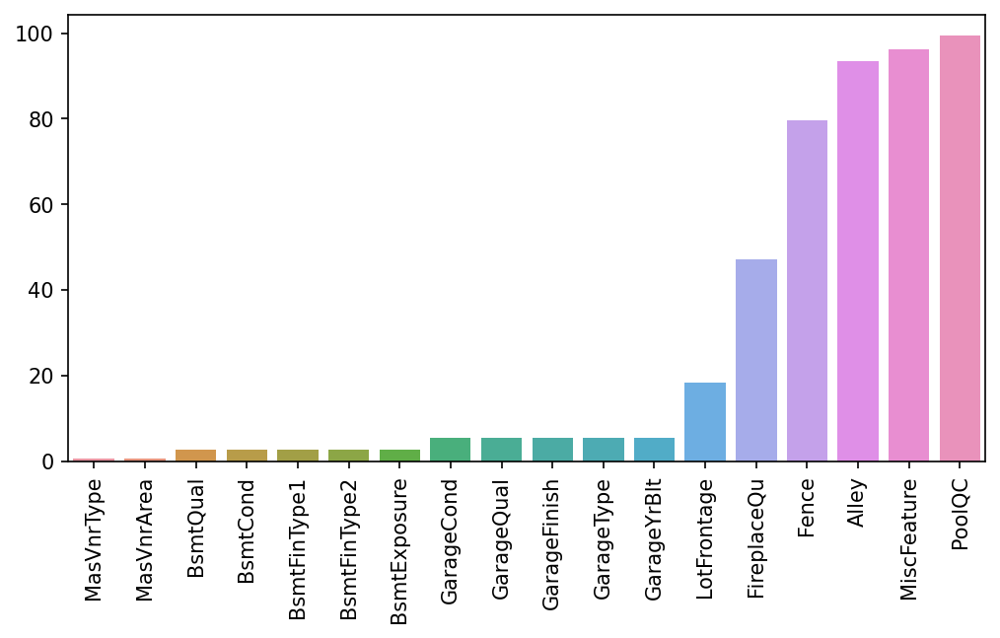

In [18]:
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [19]:
test_df.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
                 ..
MiscVal           0
MoSold            0
YrSold            0
SaleType          0
SaleCondition     0
Length: 80, dtype: int64

In [20]:
def percent_missing(test_df):
    percent_nan=100*test_df.isnull().sum()/len(test_df)
    percent_nan=percent_nan[percent_nan>0].sort_values()
    return percent_nan

In [21]:
percent_nan=percent_missing(test_df)
percent_nan

Electrical        0.342466
MasVnrType        0.342466
MasVnrArea        0.342466
BsmtQual          2.397260
BsmtCond          2.397260
BsmtExposure      2.397260
BsmtFinType1      2.397260
BsmtFinType2      2.397260
GarageCond        5.821918
GarageQual        5.821918
GarageFinish      5.821918
GarageType        5.821918
GarageYrBlt       5.821918
LotFrontage      15.410959
FireplaceQu      47.602740
Fence            84.931507
Alley            95.205479
MiscFeature      96.575342
PoolQC          100.000000
dtype: float64

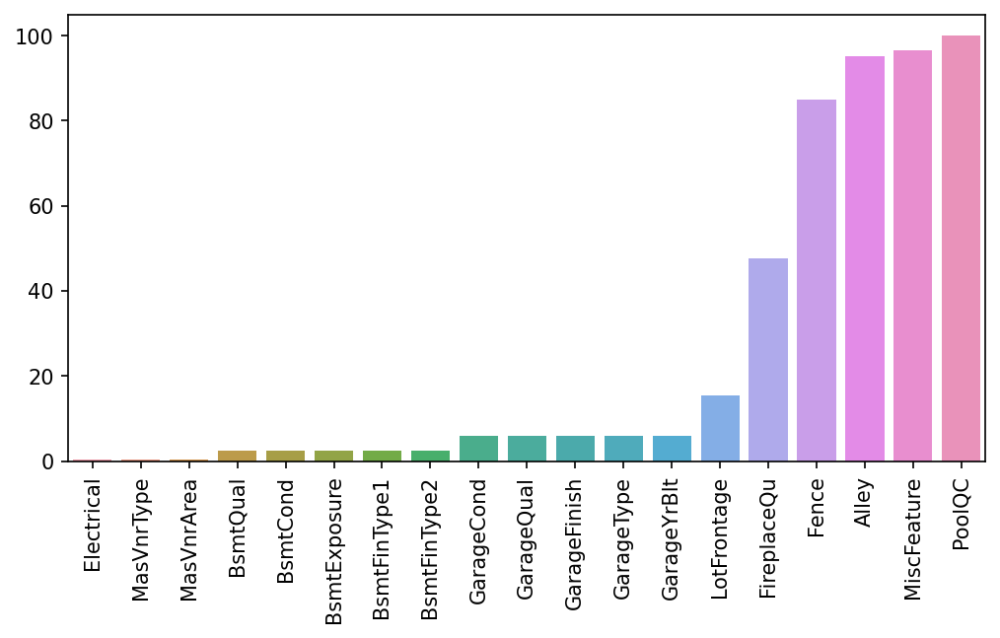

In [22]:
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

# 6. Seperating Numerical and Categorical value

## Train Dataset

In [23]:
train_numeric_feat=[]
train_categorical_feat=[]
num=["int64","float64"]
cat=["O"]
for column in train_df.columns:
    if train_df[column].dtypes in num:
        train_numeric_feat.append(column)
    if train_df[column].dtypes in cat:
        train_categorical_feat.append(column)

# Test Dataset

In [24]:
test_numeric_feat=[]
test_categorical_feat=[]
num=["int64","float64"]
cat=["O"]
for column in test_df.columns:
    if test_df[column].dtypes in num:
        test_numeric_feat.append(column)
    if test_df[column].dtypes in cat:
        test_categorical_feat.append(column)

# 7 Dealing with Missing Value

## Train Dataset

In [25]:
train_df["MasVnrType"].isnull().sum()

7

In [26]:
train_df[train_df["MasVnrType"].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
68,530,20,RL,NaN,32668,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Alloca,200624
78,1244,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2006,New,Partial,465000
99,651,60,FV,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2008,WD,Normal,205950
185,974,20,FV,95.0,11639,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,New,Partial,182000
224,978,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,11,2007,New,Partial,199900
367,1279,60,RL,75.0,9473,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2008,WD,Normal,237000
874,235,60,RL,NaN,7851,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,216500


In [27]:
train_df[train_df["MasVnrType"].isnull()]["MasVnrArea"]

68    NaN
78    NaN
99    NaN
185   NaN
224   NaN
367   NaN
874   NaN
Name: MasVnrArea, dtype: float64

**As we can observe that MasVnrType and MasVnrArea having same rows null values.**

In [28]:
train_df["MasVnrType"]=train_df["MasVnrType"].fillna("None")

In [29]:
train_df[train_df["MasVnrType"].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [30]:
train_df["MasVnrArea"].isnull().sum()

7

In [31]:
train_df["MasVnrArea"]=train_df["MasVnrArea"].fillna(0)

In [32]:
train_df["MasVnrArea"].isnull().sum()

0

In [33]:
percent_nan=percent_missing(train_df)
percent_nan

BsmtQual         2.568493
BsmtCond         2.568493
BsmtFinType1     2.568493
BsmtExposure     2.654110
BsmtFinType2     2.654110
GarageType       5.479452
GarageYrBlt      5.479452
GarageFinish     5.479452
GarageQual       5.479452
GarageCond       5.479452
LotFrontage     18.321918
FireplaceQu     47.174658
Fence           79.708904
Alley           93.407534
MiscFeature     96.232877
PoolQC          99.400685
dtype: float64

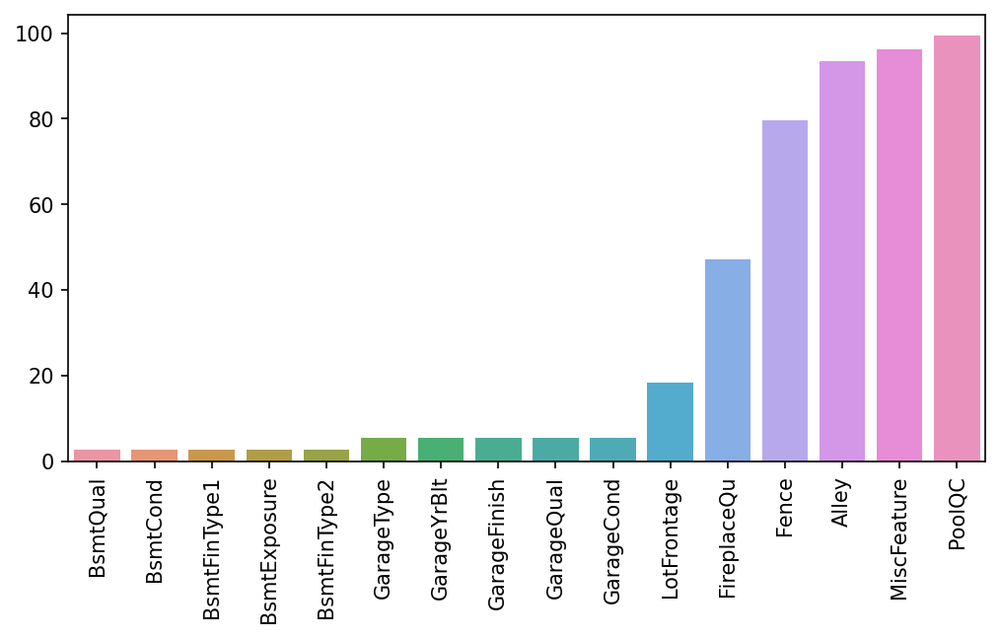

In [34]:
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [35]:
train_df["BsmtQual"].isnull().sum()

30

In [36]:
train_df[train_df["BsmtQual"].isnull()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
34,869,60,RL,NaN,14762,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,169000
48,534,20,RL,50.0,5000,Pave,NaN,Reg,Low,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,39300
54,1050,20,RL,60.0,11100,Pave,NaN,Reg,Low,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Abnorml,84900
60,533,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,107500
86,157,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2006,WD,Normal,109500
96,779,90,RH,60.0,8400,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,144000
124,91,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,109900
137,393,20,RL,NaN,8339,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,1200,7,2007,WD,Normal,106500
159,1322,20,RL,NaN,6627,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,72500
226,183,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,120000


In [37]:
train_df["BsmtQual"].value_counts()

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [38]:
mode=train_df["BsmtQual"].mode()

**We will fill na with the mode value of column.**

In [39]:
train_df["BsmtQual"]=train_df["BsmtQual"].fillna(mode[0])

In [40]:
train_df["BsmtQual"].isnull().sum()

0

In [41]:
train_df["BsmtQual"].value_counts()

TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [42]:
train_df["BsmtCond"].isnull().sum()

30

In [43]:
train_df["BsmtCond"].value_counts()

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

**We will fill na with the mode value of column.**

In [44]:
mode=train_df["BsmtCond"].mode()

In [45]:
mode

0    TA
dtype: object

In [46]:
train_df["BsmtCond"]=train_df["BsmtCond"].fillna(mode[0])

In [47]:
train_df["BsmtCond"].isnull().sum()

0

In [48]:
train_df["BsmtCond"].value_counts()

TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

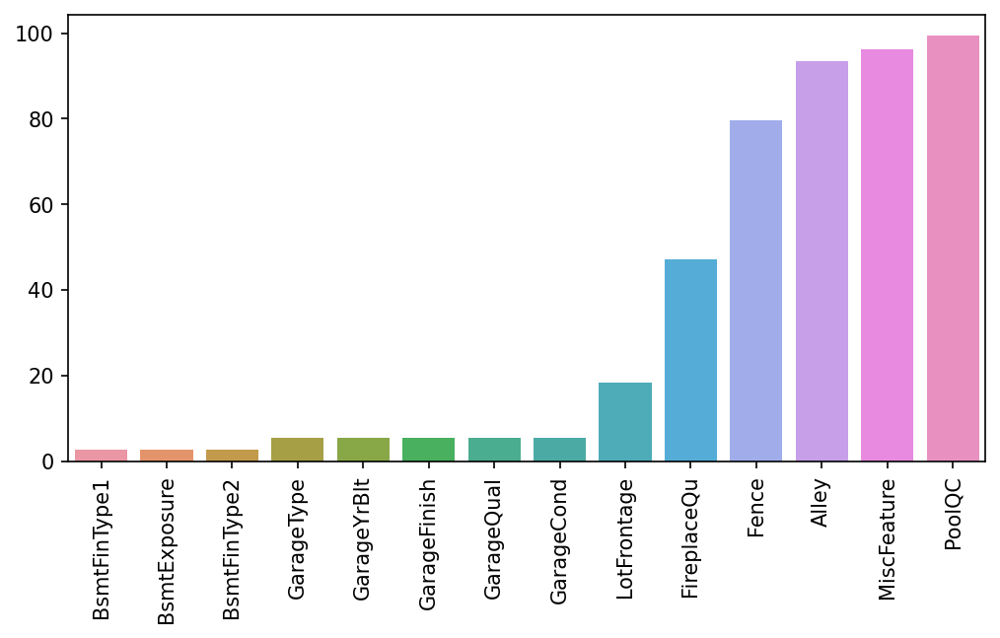

In [49]:
percent_nan=percent_missing(train_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [50]:
train_df["PoolQC"].isnull().sum()

1161

In [51]:
train_df["PoolQC"]=train_df["PoolQC"].fillna(0)

In [52]:
train_df["PoolQC"].isnull().sum()

0

In [53]:
train_df["MiscFeature"].isnull().sum()

1124

In [54]:
train_df["MiscFeature"].value_counts()

Shed    40
Gar2     2
TenC     1
Othr     1
Name: MiscFeature, dtype: int64

In [55]:
mode=train_df["MiscFeature"].mode()

In [56]:
train_df["MiscFeature"]=train_df["MiscFeature"].fillna(mode[0])

In [57]:
train_df["MiscFeature"].value_counts()

Shed    1164
Gar2       2
TenC       1
Othr       1
Name: MiscFeature, dtype: int64

In [58]:
train_df["Alley"].isnull().sum()

1091

In [59]:
train_df["Alley"].value_counts()

Grvl    41
Pave    36
Name: Alley, dtype: int64

In [60]:
train_df["Alley"]=train_df["Alley"].fillna("NA")

In [61]:
train_df["Alley"].value_counts()

NA      1091
Grvl      41
Pave      36
Name: Alley, dtype: int64

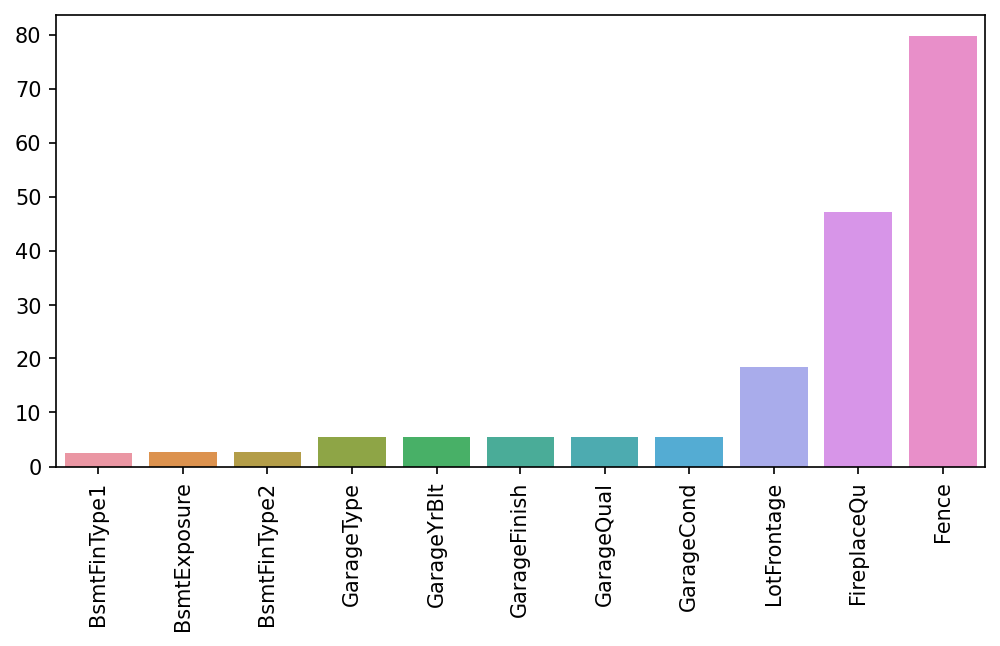

In [62]:
percent_nan=percent_missing(train_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [63]:
train_df["Fence"].isnull().sum()

931

In [64]:
train_df["Fence"].value_counts()

MnPrv    129
GdPrv     51
GdWo      47
MnWw      10
Name: Fence, dtype: int64

In [65]:
train_df["Fence"]=train_df["Fence"].fillna("NA")

In [66]:
train_df["Fence"].isnull().sum()

0

In [67]:
train_df["Fence"].value_counts()

NA       931
MnPrv    129
GdPrv     51
GdWo      47
MnWw      10
Name: Fence, dtype: int64

In [68]:
train_df["FireplaceQu"].isnull().sum()

551

In [69]:
train_df["FireplaceQu"].value_counts()

Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

In [70]:
train_df["FireplaceQu"]=train_df["FireplaceQu"].fillna("NA")

In [71]:
train_df["FireplaceQu"].isnull().sum()

0

In [72]:
train_df["FireplaceQu"].value_counts()

NA    551
Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

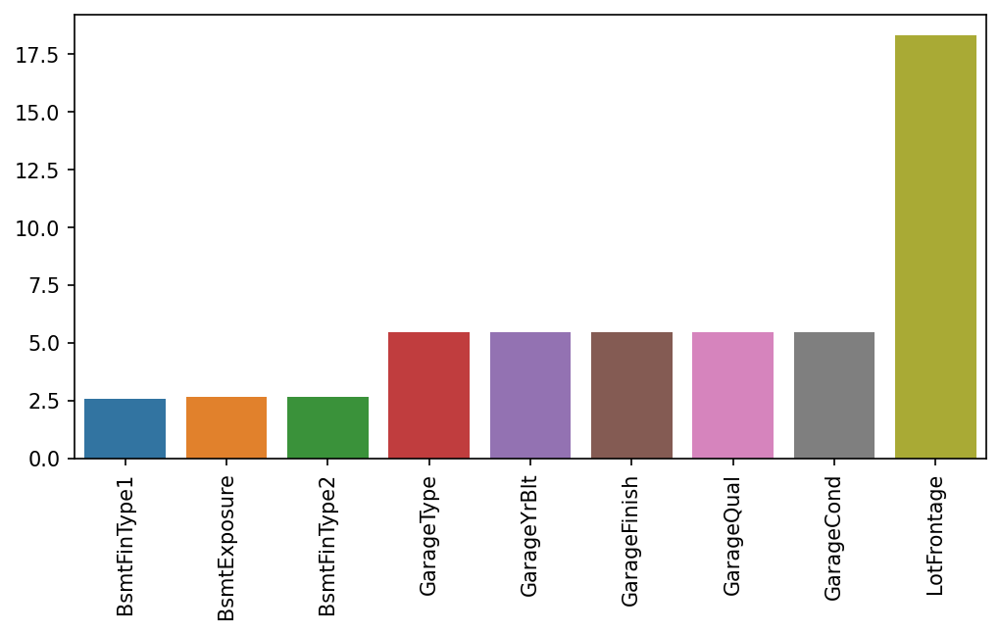

In [73]:
percent_nan=percent_missing(train_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [74]:
train_df["LotFrontage"].isnull().sum()

214

In [75]:
lot_frontage_by_neighborhood = train_df['LotFrontage'].groupby(train_df['Neighborhood'])


In [76]:
for key, group in lot_frontage_by_neighborhood:
    idx = (train_df['Neighborhood'] == key) & (train_df['LotFrontage'].isnull())
    train_df.loc[idx, 'LotFrontage'] = group.median()
    

In [77]:
train_df["LotFrontage"].isnull().sum()

0

In [78]:
train_df["GarageType"].isnull().sum()

64

In [79]:
train_df["GarageType"].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

In [80]:
train_df["GarageType"]=train_df["GarageType"].fillna("NA")

In [81]:
train_df["GarageType"].isnull().sum()

0

In [82]:
train_df["GarageType"].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
NA          64
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

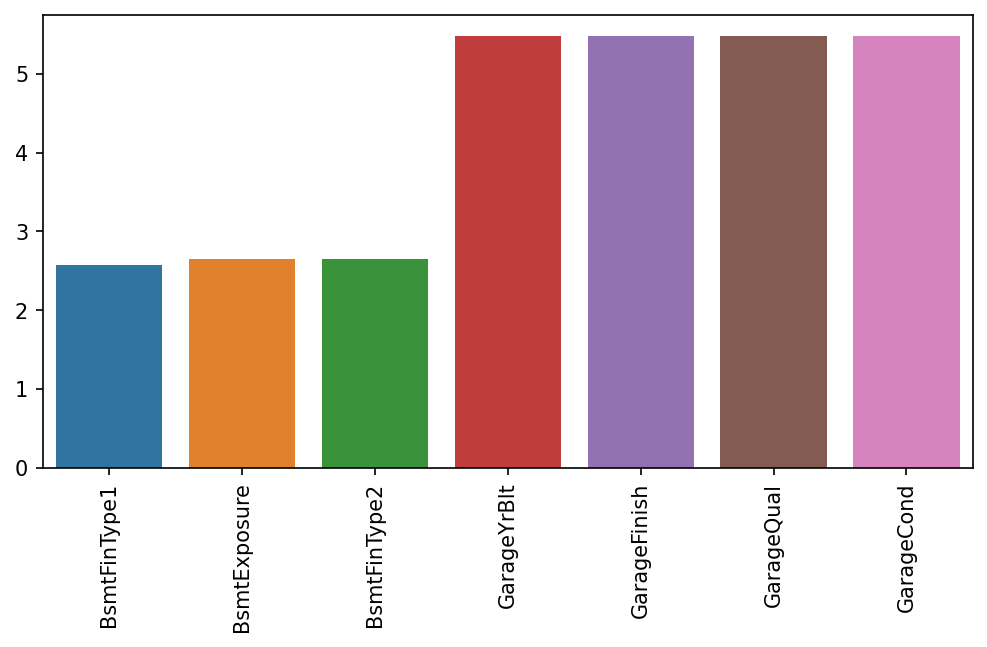

In [83]:
percent_nan=percent_missing(train_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [84]:
train_df["GarageYrBlt"].isnull().sum()

64

In [85]:
train_df["GarageYrBlt"].value_counts()

2006.0    52
2005.0    51
2007.0    40
2003.0    37
2004.0    36
          ..
1908.0     1
1900.0     1
1906.0     1
1927.0     1
1933.0     1
Name: GarageYrBlt, Length: 97, dtype: int64

In [86]:
median=train_df["GarageYrBlt"].median()

In [87]:
train_df["GarageYrBlt"]=train_df["GarageYrBlt"].fillna(median)

In [88]:
train_df["GarageYrBlt"].isnull().sum()

0

In [89]:
train_df["GarageFinish"].isnull().sum()

64

In [90]:
train_df["GarageFinish"].value_counts()

Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

In [91]:
mode=train_df["GarageFinish"].mode()

In [92]:
train_df["GarageFinish"]=train_df["GarageFinish"].fillna(mode[0])

In [93]:
train_df["GarageFinish"].isnull().sum()

0

In [94]:
train_df["GarageFinish"].value_counts()

Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

In [95]:
train_df["GarageQual"].isnull().sum()

64

In [96]:
train_df["GarageQual"].value_counts()

TA    1050
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64

In [97]:
mode=train_df["GarageQual"].mode()

In [98]:
train_df["GarageQual"]=train_df["GarageQual"].fillna(mode[0])

In [99]:
train_df["GarageQual"].isnull().sum()

0

In [100]:
train_df["GarageQual"].value_counts()

TA    1114
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64

In [101]:
train_df["GarageCond"].isnull().sum()

64

In [102]:
train_df["GarageCond"].value_counts()

TA    1061
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

In [103]:
mode=train_df["GarageCond"].mode()

In [104]:
train_df["GarageCond"]=train_df["GarageCond"].fillna(mode[0])

In [105]:
train_df["GarageCond"].isnull().sum()

0

In [106]:
train_df["GarageCond"].value_counts()

TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

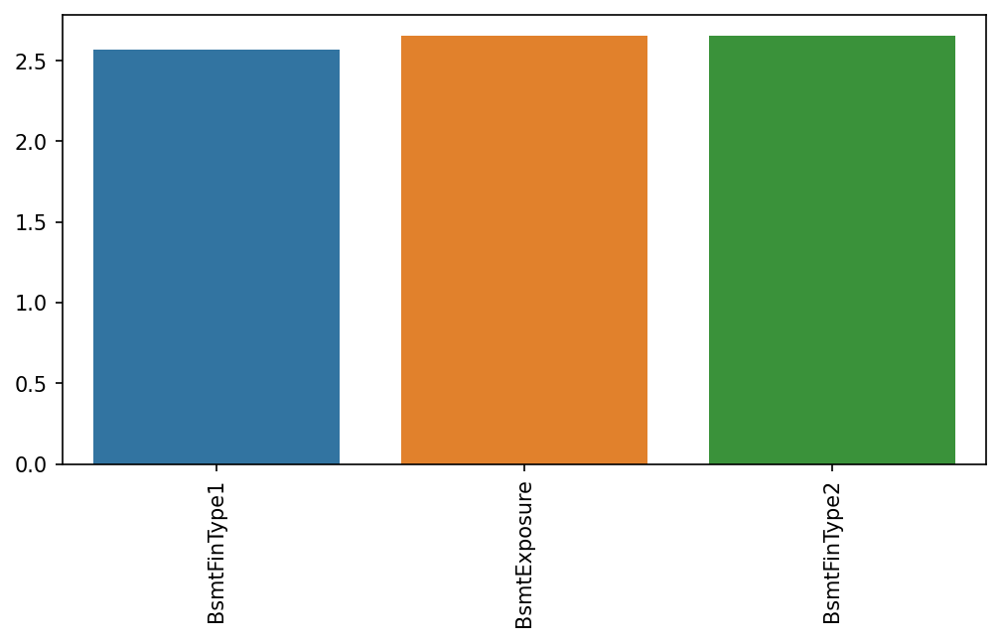

In [107]:
percent_nan=percent_missing(train_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [108]:
train_df["BsmtFinType1"].isnull().sum()

30

In [109]:
train_df["BsmtFinType1"].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

In [110]:
train_df["BsmtFinType1"]=train_df["BsmtFinType1"].fillna("NA")

In [111]:
train_df["BsmtFinType1"].isnull().sum()

0

In [112]:
train_df["BsmtFinType1"].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
NA      30
Name: BsmtFinType1, dtype: int64

In [113]:
train_df["BsmtFinType2"].isnull().sum()

31

In [114]:
train_df["BsmtFinType2"].value_counts()

Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [115]:
train_df["BsmtFinType2"]=train_df["BsmtFinType2"].fillna("NA")

In [116]:
train_df["BsmtFinType2"].isnull().sum()

0

In [117]:
train_df["BsmtFinType2"].value_counts()

Unf    1002
Rec      43
LwQ      40
NA       31
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [118]:
train_df["BsmtExposure"].isnull().sum()

31

In [119]:
train_df["BsmtExposure"].value_counts()

No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

In [120]:
train_df["BsmtExposure"]=train_df["BsmtExposure"].fillna("NA")

In [121]:
train_df["BsmtExposure"].isnull().sum()

0

In [122]:
train_df["BsmtExposure"].value_counts()

No    756
Av    180
Gd    108
Mn     93
NA     31
Name: BsmtExposure, dtype: int64

In [123]:
train_df.isnull().sum().sum()

0

## Test Dataset

In [124]:
test_df.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage      45
LotArea           0
                 ..
MiscVal           0
MoSold            0
YrSold            0
SaleType          0
SaleCondition     0
Length: 80, dtype: int64

In [125]:
percent_nan=percent_missing(test_df)
percent_nan

Electrical        0.342466
MasVnrType        0.342466
MasVnrArea        0.342466
BsmtQual          2.397260
BsmtCond          2.397260
BsmtExposure      2.397260
BsmtFinType1      2.397260
BsmtFinType2      2.397260
GarageCond        5.821918
GarageQual        5.821918
GarageFinish      5.821918
GarageType        5.821918
GarageYrBlt       5.821918
LotFrontage      15.410959
FireplaceQu      47.602740
Fence            84.931507
Alley            95.205479
MiscFeature      96.575342
PoolQC          100.000000
dtype: float64

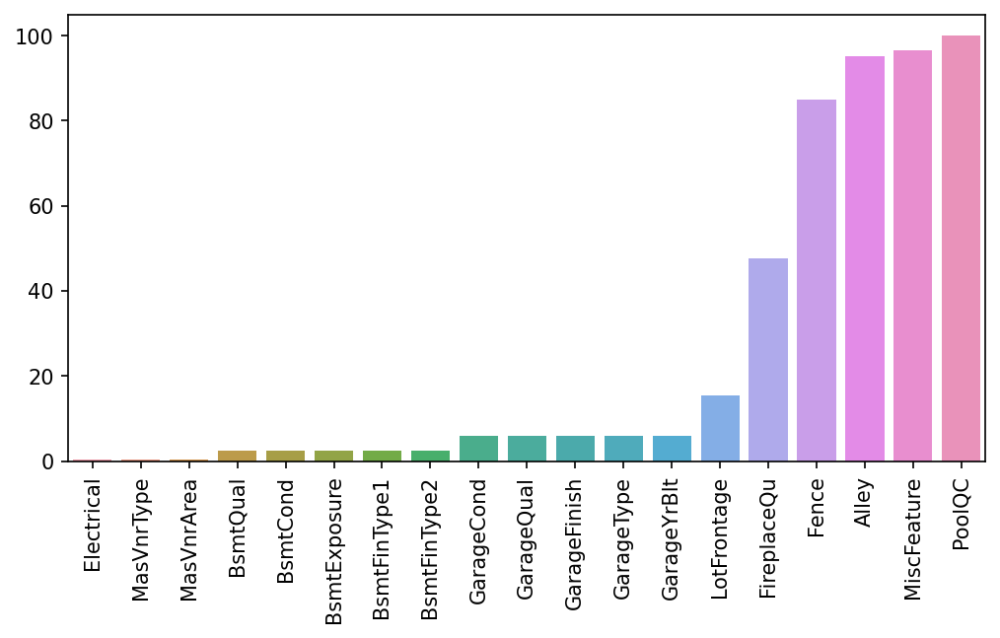

In [126]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

**As we can see that Alley,micsFeature and poolQC having more than 90% observation missing, so we will drop these columns.**

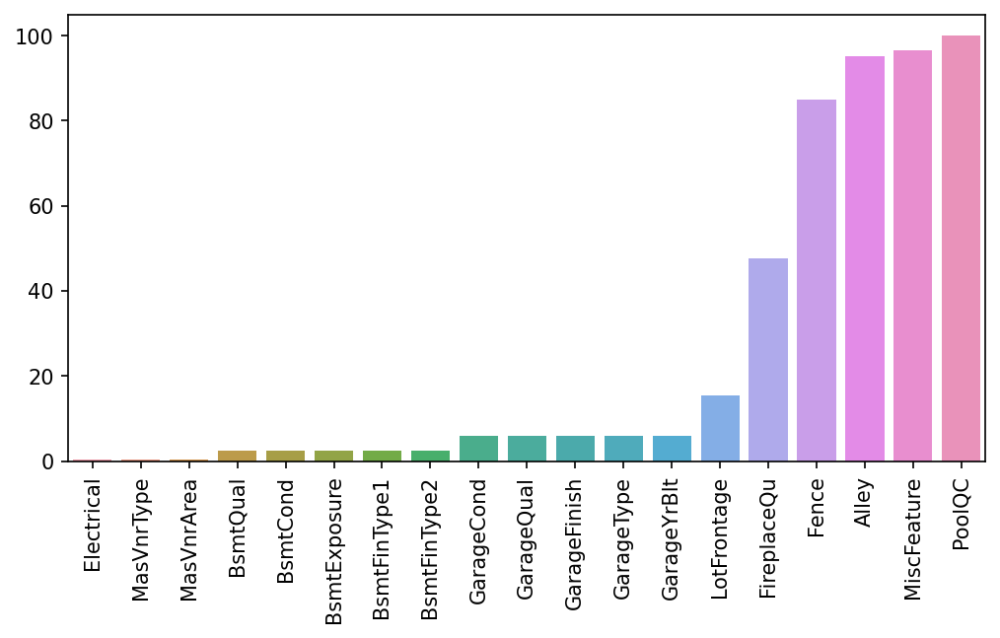

In [127]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [128]:
test_df["MasVnrType"].isnull().sum()

1

In [129]:
test_df["MasVnrType"].value_counts()

None       168
BrkFace     91
Stone       30
BrkCmn       2
Name: MasVnrType, dtype: int64

In [130]:
test_df["MasVnrType"]=test_df["MasVnrType"].fillna("None")

In [131]:
test_df["MasVnrType"].isnull().sum()

0

In [132]:
test_df["MasVnrType"].value_counts()

None       169
BrkFace     91
Stone       30
BrkCmn       2
Name: MasVnrType, dtype: int64

In [133]:
test_df["MasVnrArea"].isnull().sum()

1

In [134]:
test_df["MasVnrArea"]=test_df["MasVnrArea"].fillna(0)

In [135]:
test_df["MasVnrArea"].isnull().sum()

0

In [136]:
test_df["Electrical"].isnull().sum()

1

In [137]:
test_df["Electrical"].value_counts()

SBrkr    264
FuseA     20
FuseF      6
FuseP      1
Name: Electrical, dtype: int64

In [138]:
mode=test_df["Electrical"].mode()

In [139]:
test_df["Electrical"]=test_df["Electrical"].fillna(mode[0])

In [140]:
test_df["Electrical"].isnull().sum()

0

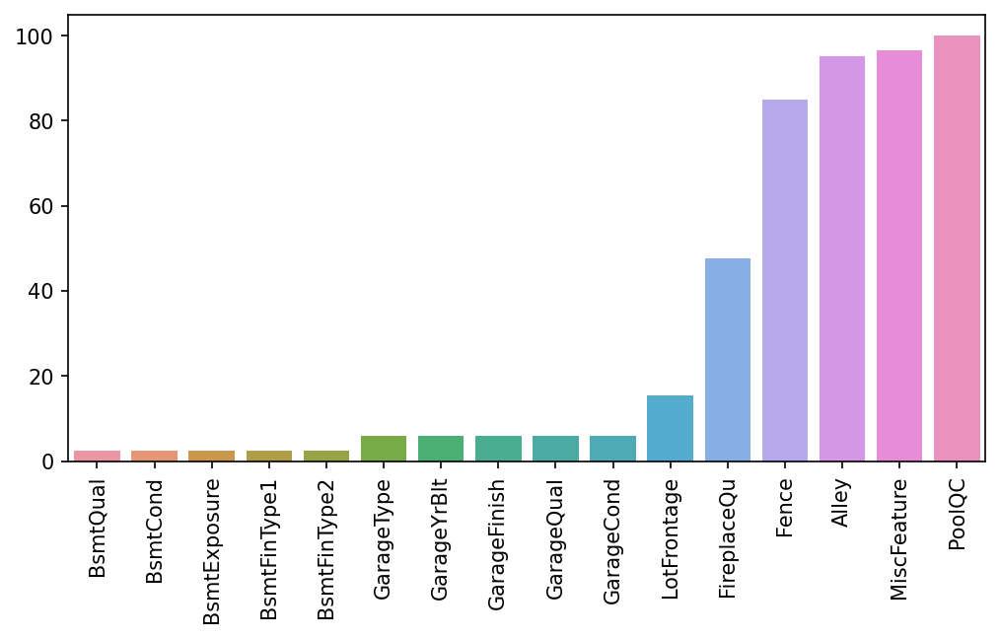

In [141]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [142]:
test_df["BsmtQual"].isnull().sum()

7

In [143]:
test_df["BsmtQual"].value_counts()

TA    132
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64

In [144]:
mode=test_df["BsmtQual"].mode()

In [145]:
test_df["BsmtQual"]=test_df["BsmtQual"].fillna(mode[0])

In [146]:
test_df["BsmtQual"].isnull().sum()

0

In [147]:
test_df["BsmtQual"].value_counts()

TA    139
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64

In [148]:
test_df["BsmtCond"].isnull().sum()

7

In [149]:
test_df["BsmtCond"].value_counts()

TA    270
Gd      9
Fa      6
Name: BsmtCond, dtype: int64

In [150]:
mode=test_df["BsmtCond"].mode()

In [151]:
test_df["BsmtCond"]=test_df["BsmtCond"].fillna(mode[0])

In [152]:
test_df["BsmtCond"].isnull().sum()

0

In [153]:
test_df["BsmtExposure"].isnull().sum()

7

In [154]:
test_df["BsmtExposure"].value_counts()

No    197
Av     41
Gd     26
Mn     21
Name: BsmtExposure, dtype: int64

In [155]:
test_df["BsmtExposure"]=test_df["BsmtExposure"].fillna("NA")

In [156]:
test_df["BsmtExposure"].isnull().sum()

0

In [157]:
test_df["BsmtFinType1"].isnull().sum()

7

In [158]:
test_df["BsmtFinType1"]=test_df["BsmtFinType1"].fillna("NA")

In [159]:
test_df["BsmtFinType1"].isnull().sum()

0

In [160]:
test_df["BsmtFinType2"].isnull().sum()

7

In [161]:
test_df["BsmtFinType2"]=test_df["BsmtFinType2"].fillna("NA")

In [162]:
test_df["BsmtFinType2"].isnull().sum()

0

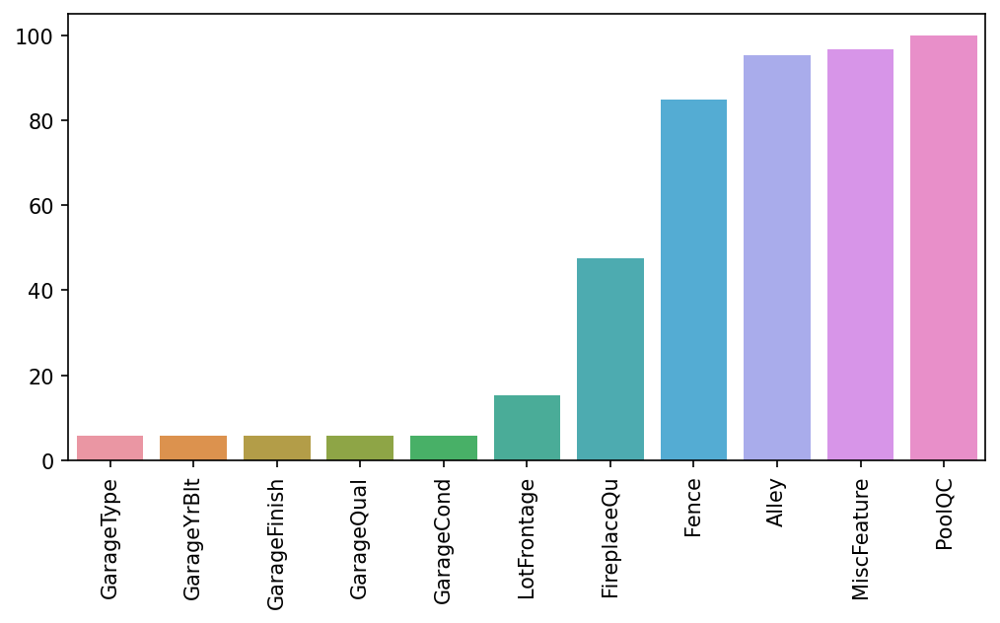

In [163]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [164]:
test_df["GarageType"].isnull().sum()

17

In [165]:
test_df["GarageType"]=test_df["GarageType"].fillna("NA")

In [166]:
test_df["GarageType"].isnull().sum()

0

In [167]:
test_df["GarageYrBlt"].isnull().sum()

17

In [168]:
median=test_df["GarageYrBlt"].median()

In [169]:
test_df["GarageYrBlt"]=test_df["GarageYrBlt"].fillna(median)

In [170]:
test_df["GarageYrBlt"].isnull().sum()

0

In [171]:
test_df["GarageFinish"].isnull().sum()

17

In [172]:
mode=test_df["GarageFinish"].mode()

In [173]:
test_df["GarageFinish"]=test_df["GarageFinish"].fillna(mode[0])

In [174]:
test_df["GarageFinish"].isnull().sum()

0

In [175]:
test_df["GarageQual"].isnull().sum()

17

In [176]:
mode=test_df["GarageQual"].mode()

In [177]:
test_df["GarageQual"]=test_df["GarageQual"].fillna(mode[0])

In [178]:
test_df["GarageQual"].isnull().sum()

0

In [179]:
test_df["GarageCond"].isnull().sum()

17

In [180]:
mode=test_df["GarageCond"].mode()

In [181]:
test_df["GarageCond"]=test_df["GarageCond"].fillna(mode[0])

In [182]:
test_df["GarageCond"].isnull().sum()

0

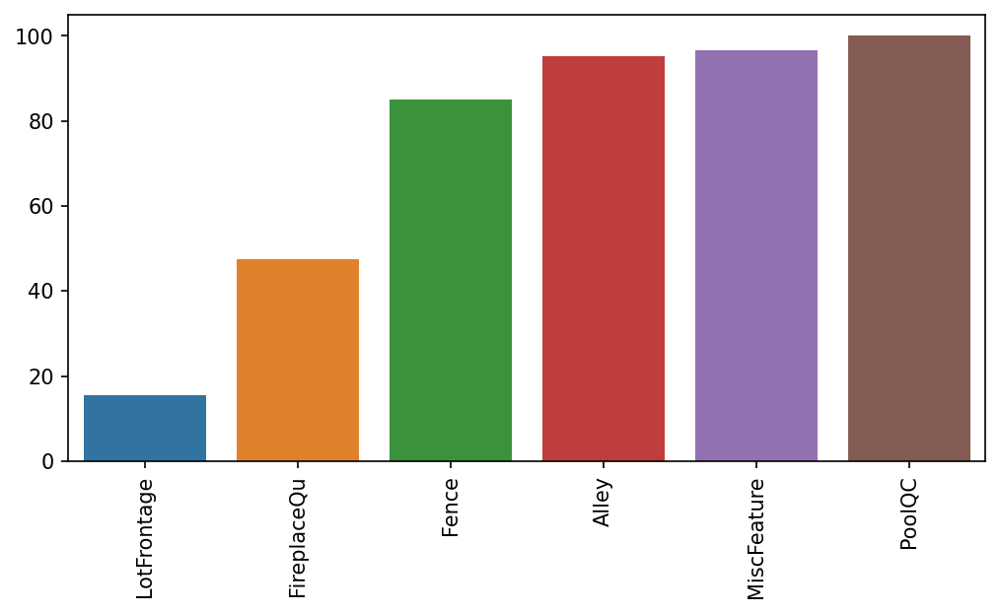

In [183]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [184]:
test_df["LotFrontage"].isnull().sum()

45

In [185]:
lot_frontage_by_neighborhood = test_df['LotFrontage'].groupby(test_df['Neighborhood'])
for key, group in lot_frontage_by_neighborhood:
    idx = (test_df['Neighborhood'] == key) & (test_df['LotFrontage'].isnull())
    test_df.loc[idx, 'LotFrontage'] = group.median()
    

In [186]:
test_df["LotFrontage"].isnull().sum()

0

In [187]:
test_df["FireplaceQu"].isnull().sum()

139

In [188]:
test_df["FireplaceQu"]=test_df["FireplaceQu"].fillna("NA")

In [189]:
test_df["FireplaceQu"].isnull().sum()

0

In [190]:
test_df["Fence"].isnull().sum()

248

In [191]:
test_df["Fence"]=test_df["Fence"].fillna("NA")

In [192]:
test_df["Fence"].isnull().sum()

0

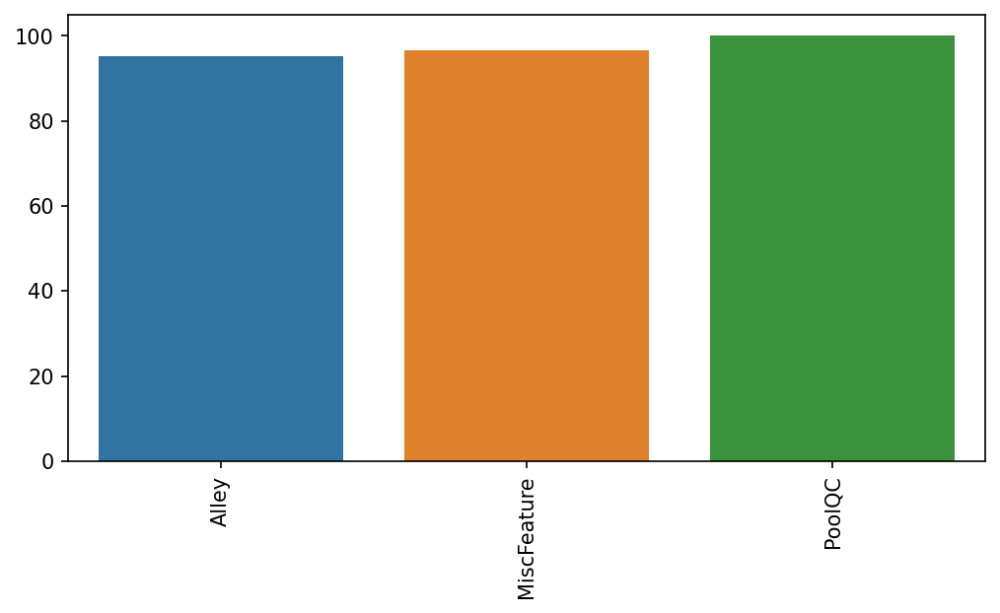

In [193]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [194]:
test_df["Alley"].isnull().sum()

278

In [195]:
test_df["Alley"]=test_df["Alley"].fillna("NA")

In [196]:
test_df["Alley"].isnull().sum()

0

In [197]:
test_df["MiscFeature"].isnull().sum()

282

In [198]:
mode=test_df["MiscFeature"].mode()

In [199]:
test_df["MiscFeature"]=test_df["MiscFeature"].fillna(mode[0])

In [200]:
test_df["MiscFeature"].isnull().sum()

0

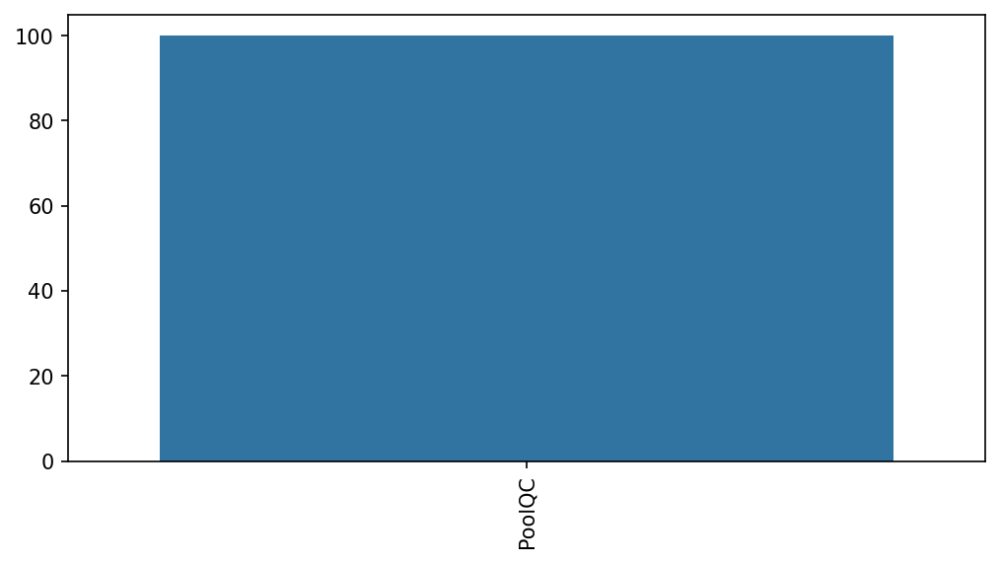

In [201]:
percent_nan=percent_missing(test_df)
plt.figure(figsize=(8,4),dpi=150)
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [202]:
test_df["PoolQC"].isnull().sum()

292

In [203]:
test_df["PoolQC"]=test_df["PoolQC"].fillna(0)

In [204]:
test_df["PoolQC"].isnull().sum()

0

# 7. Correlation of numerical Feature

In [205]:
numeric_data = train_df.select_dtypes(include=[np.number])

In [206]:
numeric_data.drop("Id",axis=1,inplace=True)

In [207]:
corr=numeric_data.corr()

In [208]:
plt.figure(figsize=(35,35),dpi=350)
sns.set(font_scale=1.4)
sns.heatmap(corr,cbar=True,annot=True,square=True,fmt=".2f",annot_kws={"size":15},linewidths=0.5)

<AxesSubplot:>

In [209]:
print(corr["SalePrice"].sort_values(ascending=False)[:15])
print("****"*20)
print(corr["SalePrice"].sort_values(ascending=False)[-5:])

SalePrice       1.000000
OverallQual     0.789185
GrLivArea       0.707300
GarageCars      0.628329
GarageArea      0.619000
TotalBsmtSF     0.595042
1stFlrSF        0.587642
FullBath        0.554988
TotRmsAbvGrd    0.528363
YearBuilt       0.514408
YearRemodAdd    0.507831
MasVnrArea      0.460535
Fireplaces      0.459611
GarageYrBlt     0.453840
BsmtFinSF1      0.362874
Name: SalePrice, dtype: float64
********************************************************************************
YrSold          -0.045508
MSSubClass      -0.060775
OverallCond     -0.065642
EnclosedPorch   -0.115004
KitchenAbvGr    -0.132108
Name: SalePrice, dtype: float64


**As we can see top 15 highly coreleated numberic feature and 5 least coreleated numerice features.**

In [210]:
corr=corr["SalePrice"]

In [211]:
d=pd.DataFrame(corr)

In [212]:
d.rename(columns={"SalePrice":"Coefficient"},inplace=True)

In [213]:
d.sort_values(by="Coefficient",inplace=True)

<AxesSubplot:>

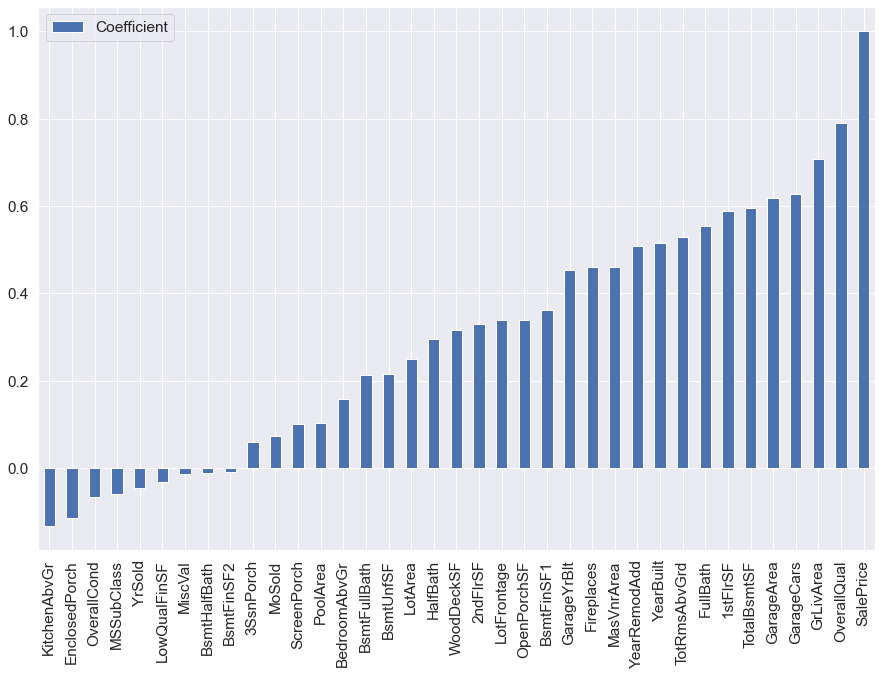

In [214]:
d.plot(kind='bar',figsize=(15,10))

# 8. Correlation of Categorical features

In [215]:
from scipy import stats

In [216]:
cat_data = train_df.select_dtypes(exclude=[np.number])

<module 'matplotlib.pyplot' from 'C:\\Users\\Admin\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

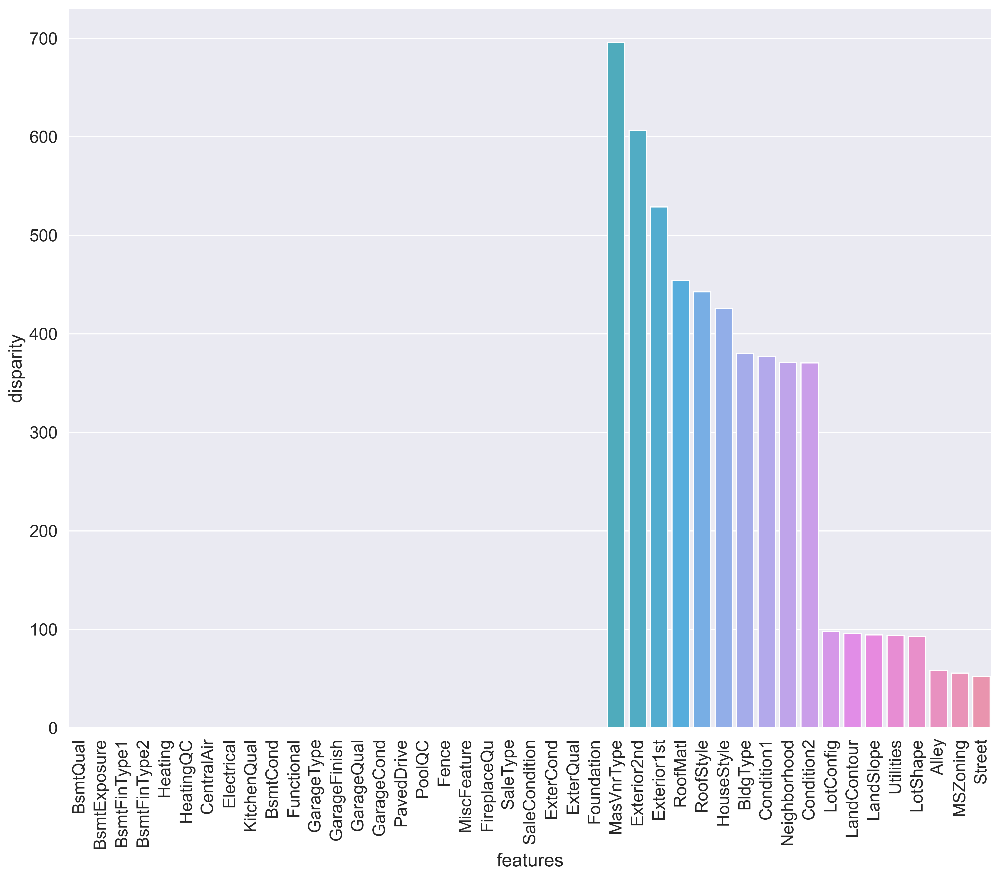

In [217]:
cat = [f for f in train_df.columns if train_df.dtypes[f] == 'object']
def anova(frame):
    anv = pd.DataFrame()
    anv['features'] = cat
    pvals = []
    samples = []
    for c in cat:           
           for cls in frame[c].unique():
                  s = frame[frame[c] == cls]['SalePrice'].values
                  samples.append(s)
           pval = stats.f_oneway(*samples)[1]
           pvals.append(pval)
    anv['pval'] = pvals
    return anv.sort_values('pval')

cat_data['SalePrice'] = train_df.SalePrice.values
k = anova(cat_data) 
k['disparity'] = np.log(1./k['pval'].values) 
plt.figure(figsize=(15,12),dpi=350)
sns.barplot(data=k, x = 'features', y='disparity') 
plt.xticks(rotation=90) 
plt 

In [617]:
k

,features,pval,disparity
21,BsmtQual,0.000000e+00,inf
23,BsmtExposure,0.000000e+00,inf
24,BsmtFinType1,0.000000e+00,inf
25,BsmtFinType2,0.000000e+00,inf
26,Heating,0.000000e+00,inf
27,HeatingQC,0.000000e+00,inf
28,CentralAir,0.000000e+00,inf
29,Electrical,0.000000e+00,inf
30,KitchenQual,0.000000e+00,inf
22,BsmtCond,0.000000e+00,inf



# 9.  Exploratory Data Analysis

In [218]:
print("\n********Count of MSZoning***********")
print(train_df["MSZoning"].value_counts())
print("\n*******% of MSZoning*************")
print(train_df["MSZoning"].value_counts(normalize=True))


********Count of MSZoning***********
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64

*******% of MSZoning*************
RL         0.794521
RM         0.139555
FV         0.044521
RH         0.013699
C (all)    0.007705
Name: MSZoning, dtype: float64


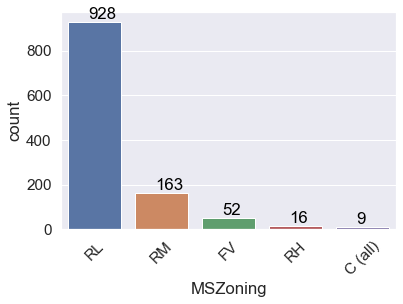

In [219]:
s=sns.countplot(train_df["MSZoning"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [220]:
mz_pivot=train_df.pivot_table(index='MSZoning', values='SalePrice', aggfunc=np.median)
mz_pivot

,SalePrice
MSZoning,
C (all),81000
FV,202925
RH,136500
RL,174000
RM,124000


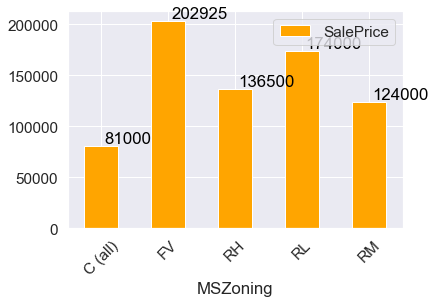

In [221]:
s=mz_pivot.plot(kind='bar',color='orange')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='OverallQual', ylabel='Density'>

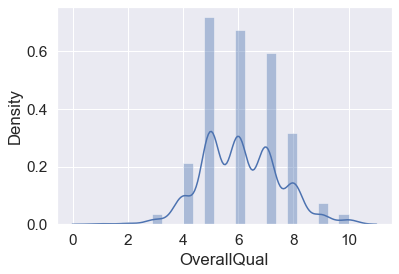

In [222]:
sns.distplot(train_df["OverallQual"])

In [223]:
oq_pivot=train_df.pivot_table(index='OverallQual', values='SalePrice', aggfunc=np.median)
oq_pivot

,SalePrice
OverallQual,
1,50150.0
2,60000.0
3,86250.0
4,108959.0
5,133700.0
6,160000.0
7,200120.5
8,268750.0
9,343821.5


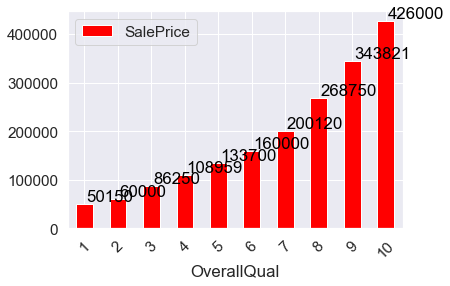

In [224]:
s=oq_pivot.plot(kind='bar',color='red')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='GrLivArea', ylabel='Density'>

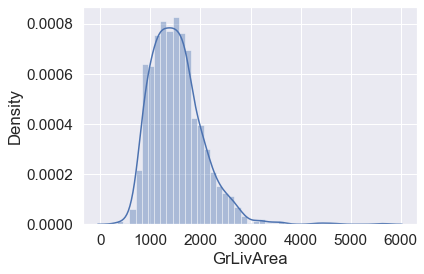

In [225]:
sns.distplot(train_df["GrLivArea"])

<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

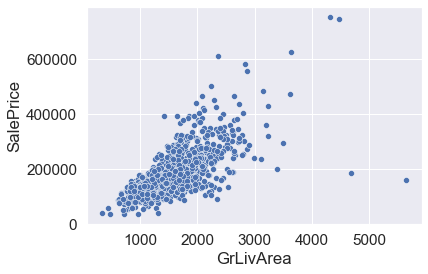

In [226]:
sns.scatterplot(x="GrLivArea",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='GarageCars', ylabel='Density'>

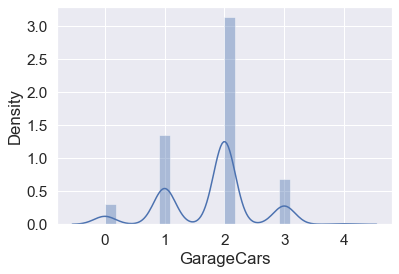

In [227]:
sns.distplot(train_df["GarageCars"])

In [228]:
gc_pivot=train_df.pivot_table(index='GarageCars', values='SalePrice', aggfunc=np.median)
gc_pivot

,SalePrice
GarageCars,
0,97500
1,129000
2,177500
3,290000
4,187150


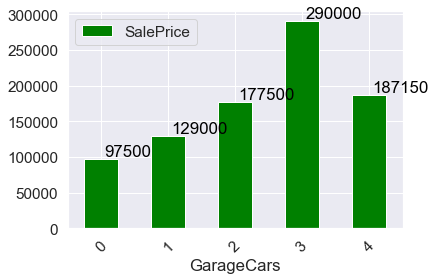

In [229]:
s=gc_pivot.plot(kind='bar',color='green')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='GarageArea', ylabel='Density'>

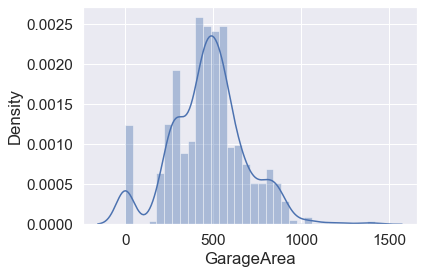

In [230]:
sns.distplot(train_df["GarageArea"])

<AxesSubplot:xlabel='GarageArea', ylabel='SalePrice'>

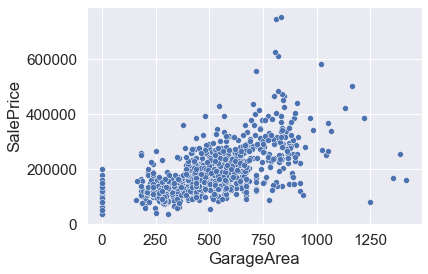

In [231]:
sns.scatterplot(x="GarageArea",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Density'>

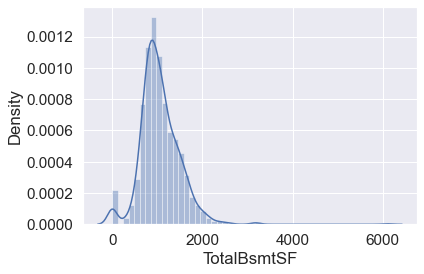

In [232]:
sns.distplot(train_df["TotalBsmtSF"])

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

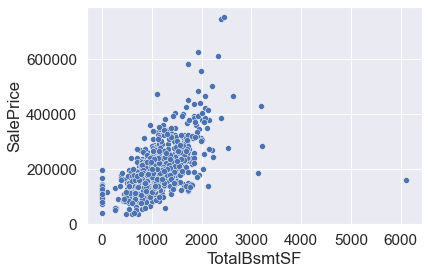

In [233]:
sns.scatterplot(x="TotalBsmtSF",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='1stFlrSF', ylabel='Density'>

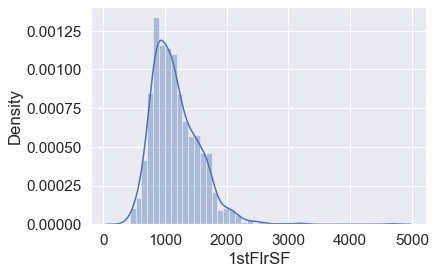

In [234]:
sns.distplot(train_df["1stFlrSF"])

<AxesSubplot:xlabel='1stFlrSF', ylabel='SalePrice'>

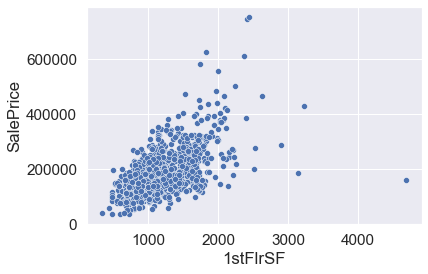

In [235]:
sns.scatterplot(x="1stFlrSF",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='FullBath', ylabel='Density'>

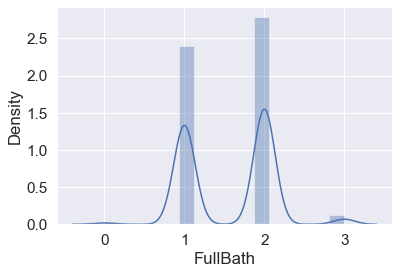

In [236]:
sns.distplot(train_df["FullBath"])

In [237]:
fb_pivot=train_df.pivot_table(index='FullBath', values='SalePrice', aggfunc=np.median)
fb_pivot

,SalePrice
FullBath,
0,153337
1,133000
2,200000
3,299800


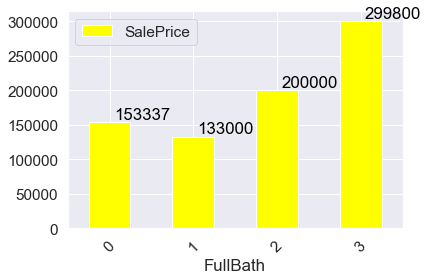

In [238]:
s=fb_pivot.plot(kind='bar',color='yellow')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='Density'>

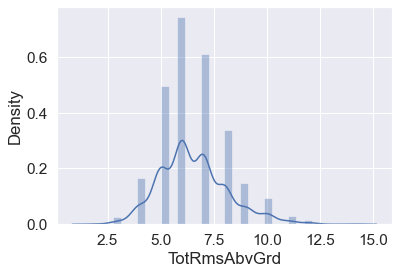

In [239]:
sns.distplot(train_df["TotRmsAbvGrd"])

In [240]:
tr_pivot=train_df.pivot_table(index='TotRmsAbvGrd', values='SalePrice', aggfunc=np.median)
tr_pivot

,SalePrice
TotRmsAbvGrd,
2,39300
3,92000
4,127500
5,130000
6,153337
7,187250
8,200000
9,252000
10,276000


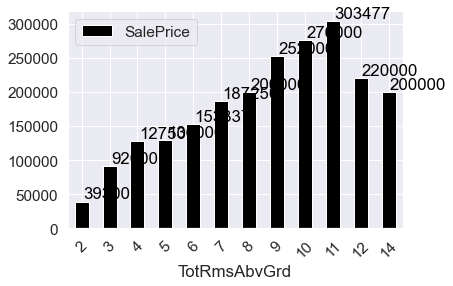

In [241]:
s=tr_pivot.plot(kind='bar',color='black')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='YearBuilt', ylabel='Density'>

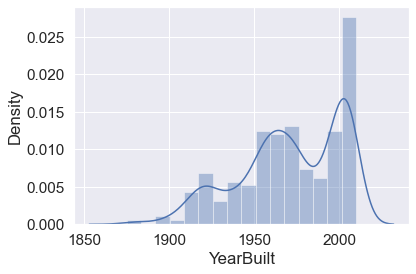

In [242]:
sns.distplot(train_df["YearBuilt"])

<AxesSubplot:xlabel='YearBuilt', ylabel='SalePrice'>

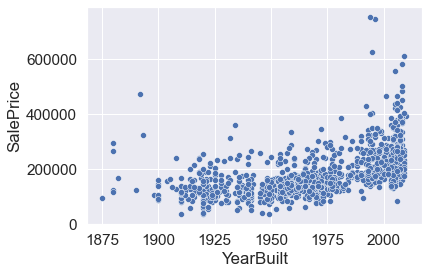

In [243]:
sns.scatterplot(x="YearBuilt",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='YearRemodAdd', ylabel='Density'>

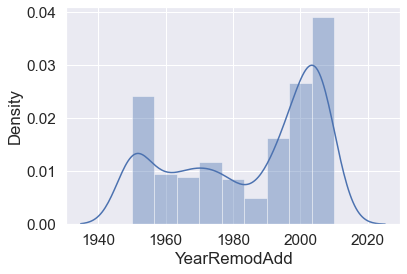

In [244]:
sns.distplot(train_df["YearRemodAdd"])

<AxesSubplot:xlabel='YearRemodAdd', ylabel='SalePrice'>

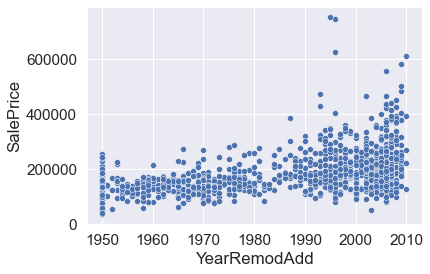

In [245]:
sns.scatterplot(x="YearRemodAdd",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='MasVnrArea', ylabel='Density'>

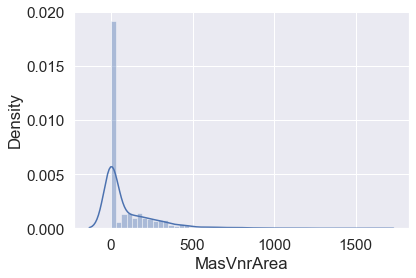

In [246]:
sns.distplot(train_df["MasVnrArea"])

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

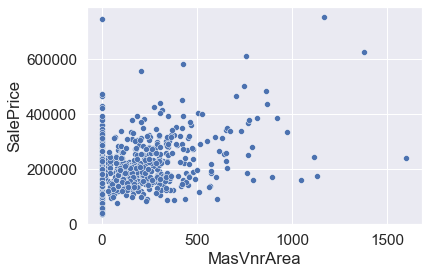

In [247]:
sns.scatterplot(x="MasVnrArea",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='Fireplaces', ylabel='Density'>

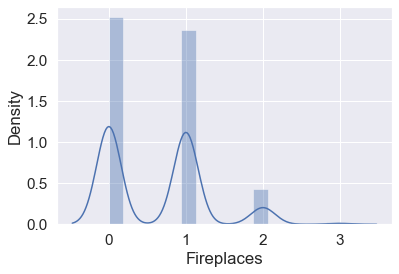

In [248]:
sns.distplot(train_df["Fireplaces"])

In [249]:
fp_pivot=train_df.pivot_table(index='Fireplaces', values='SalePrice', aggfunc=np.median)
fp_pivot

,SalePrice
Fireplaces,
0,136000
1,190000
2,205950
3,205000


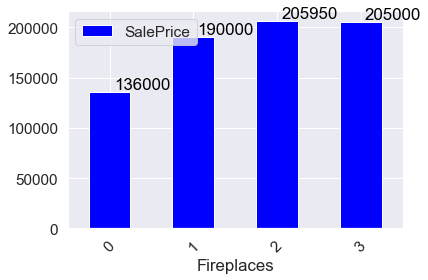

In [250]:
s=fp_pivot.plot(kind='bar',color='blue')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Density'>

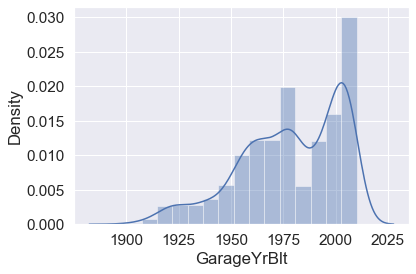

In [251]:
sns.distplot(train_df["GarageYrBlt"])

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

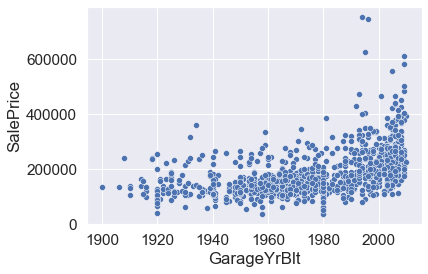

In [252]:
sns.scatterplot(x="GarageYrBlt",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='Density'>

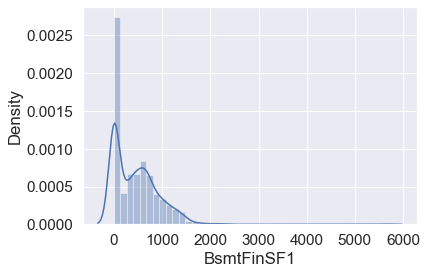

In [253]:
sns.distplot(train_df["BsmtFinSF1"])

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

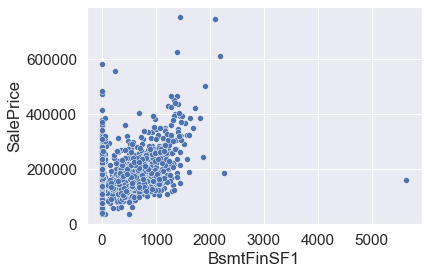

In [254]:
sns.scatterplot(x="BsmtFinSF1",y="SalePrice",data=train_df)

<AxesSubplot:xlabel='MasVnrType', ylabel='count'>

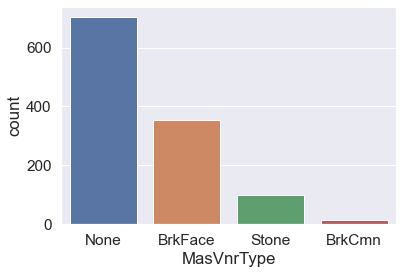

In [255]:
sns.countplot(train_df["MasVnrType"])

In [256]:
mt_pivot=train_df.pivot_table(index='MasVnrType', values='SalePrice', aggfunc=np.median)
mt_pivot

,SalePrice
MasVnrType,
BrkCmn,129000
BrkFace,184500
None,144000
Stone,240500


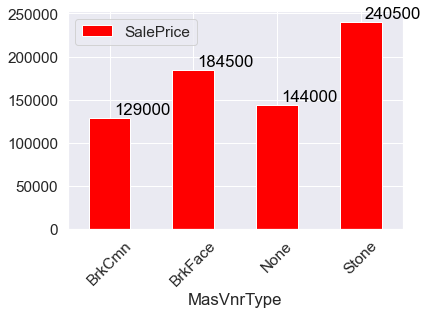

In [257]:
s=mt_pivot.plot(kind='bar',color='red')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

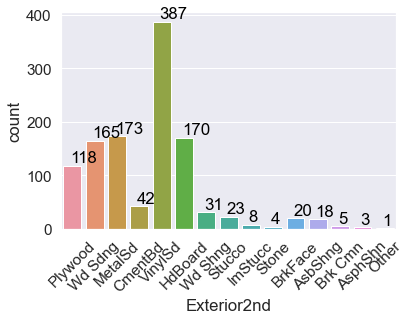

In [258]:
s=sns.countplot(train_df["Exterior2nd"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [259]:
et_pivot=train_df.pivot_table(index='Exterior2nd', values='SalePrice', aggfunc=np.median)
et_pivot

,SalePrice
Exterior2nd,
AsbShng,111000
AsphShn,139000
Brk Cmn,147000
BrkFace,162500
CmentBd,256700
HdBoard,152000
ImStucc,220600
MetalSd,136500
Other,319000


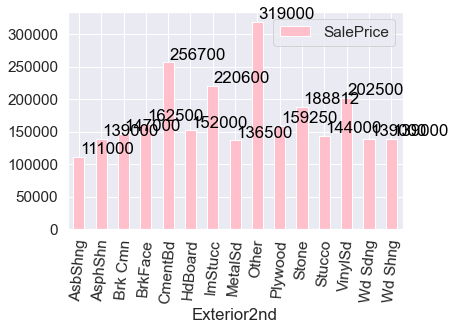

In [260]:
s=et_pivot.plot(kind='bar',color='pink')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

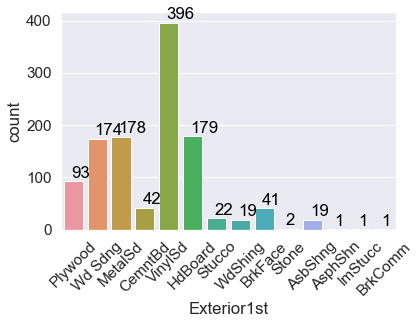

In [261]:
s=sns.countplot(train_df["Exterior1st"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [262]:
et1_pivot=train_df.pivot_table(index='Exterior1st', values='SalePrice', aggfunc=np.median)
et1_pivot

,SalePrice
Exterior1st,
AsbShng,110000
AsphShn,100000
BrkComm,60000
BrkFace,177000
CemntBd,253450
HdBoard,148000
ImStucc,262000
MetalSd,137500
Plywood,169000


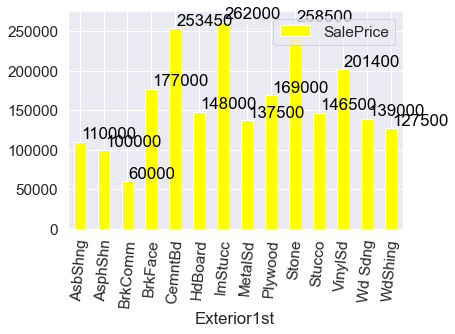

In [263]:
s=et1_pivot.plot(kind='bar',color='yellow')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

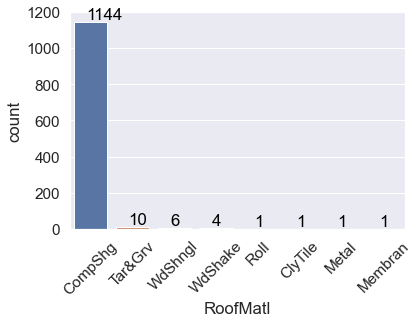

In [264]:
s=sns.countplot(train_df["RoofMatl"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [265]:
rm_pivot=train_df.pivot_table(index='RoofMatl', values='SalePrice', aggfunc=np.median)
rm_pivot

,SalePrice
RoofMatl,
ClyTile,160000
CompShg,162700
Membran,241500
Metal,180000
Roll,137000
Tar&Grv,176000
WdShake,251000
WdShngl,332500


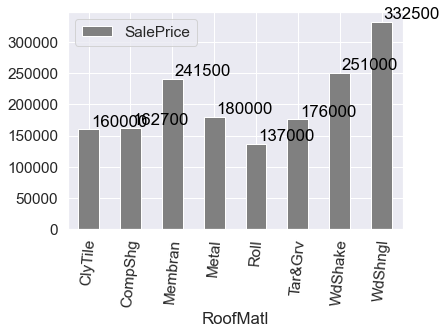

In [266]:
s=rm_pivot.plot(kind='bar',color='grey')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

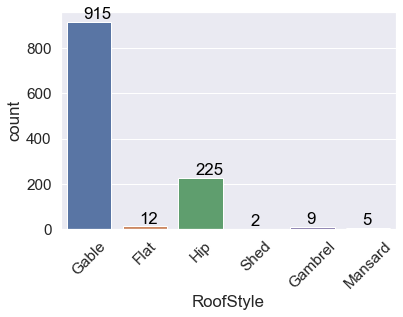

In [267]:
s=sns.countplot(train_df["RoofStyle"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [268]:
rs_pivot=train_df.pivot_table(index='RoofStyle', values='SalePrice', aggfunc=np.median)
rs_pivot

,SalePrice
RoofStyle,
Flat,210000
Gable,160000
Gambrel,139000
Hip,174000
Mansard,175000
Shed,225000


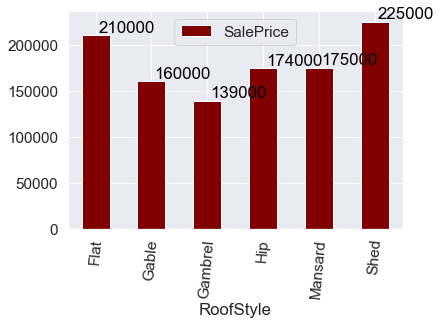

In [269]:
s=rs_pivot.plot(kind='bar',color='maroon')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

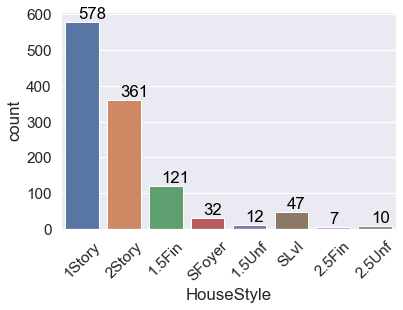

In [270]:
s=sns.countplot(train_df["HouseStyle"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [271]:
hs_pivot=train_df.pivot_table(index='HouseStyle', values='SalePrice', aggfunc=np.median)
hs_pivot

,SalePrice
HouseStyle,
1.5Fin,131000
1.5Unf,115500
1Story,155000
2.5Fin,191000
2.5Unf,131700
2Story,194500
SFoyer,136480
SLvl,168500


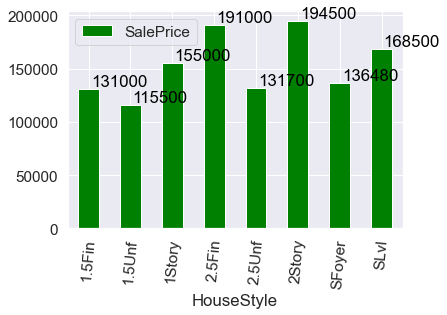

In [272]:
s=hs_pivot.plot(kind='bar',color='green')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

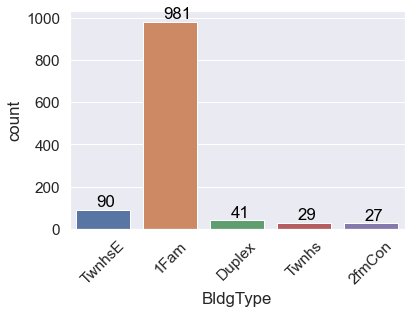

In [273]:
s=sns.countplot(train_df["BldgType"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [274]:
bt_pivot=train_df.pivot_table(index='BldgType', values='SalePrice', aggfunc=np.median)
bt_pivot

,SalePrice
BldgType,
1Fam,167900.0
2fmCon,131500.0
Duplex,136500.0
Twnhs,147400.0
TwnhsE,173866.5


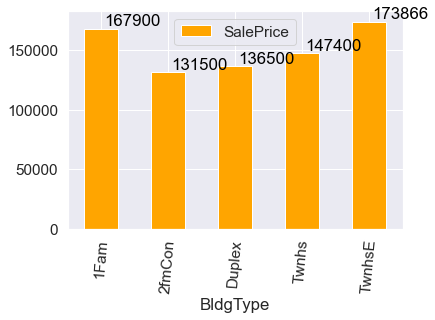

In [275]:
s=bt_pivot.plot(kind='bar',color='orange')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

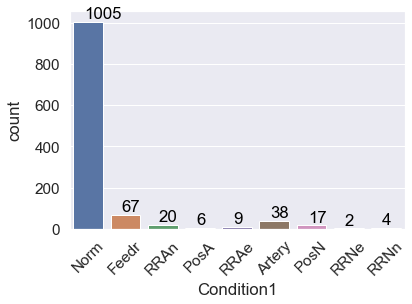

In [276]:
s=sns.countplot(train_df["Condition1"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=45);

In [277]:
c_pivot=train_df.pivot_table(index='Condition1', values='SalePrice', aggfunc=np.median)
c_pivot

,SalePrice
Condition1,
Artery,119550
Feedr,140000
Norm,167240
PosA,238500
PosN,212000
RRAe,142500
RRAn,174445
RRNe,190750
RRNn,252000


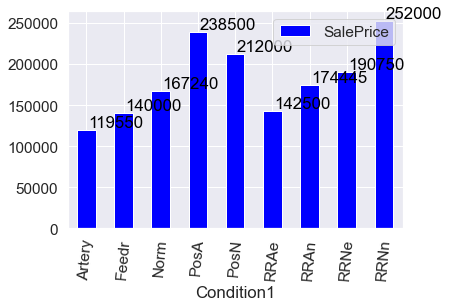

In [278]:
s=c_pivot.plot(kind='bar',color='blue')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

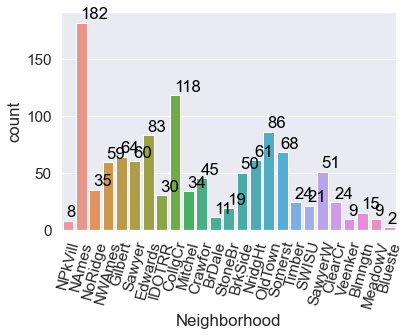

In [279]:
s=sns.countplot(train_df["Neighborhood"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [280]:
nh_pivot=train_df.pivot_table(index='Neighborhood', values='SalePrice', aggfunc=np.median)
nh_pivot

,SalePrice
Neighborhood,
Blmngtn,191000
Blueste,137500
BrDale,106000
BrkSide,120500
ClearCr,205500
CollgCr,199450
Crawfor,200624
Edwards,126000
Gilbert,182167


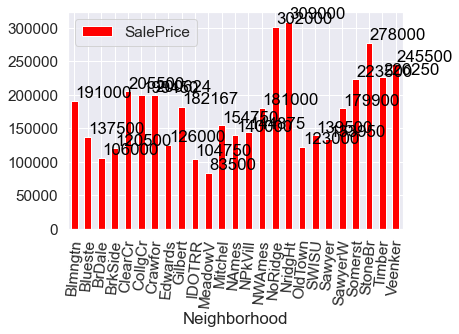

In [281]:
s=nh_pivot.plot(kind='bar',color='red')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

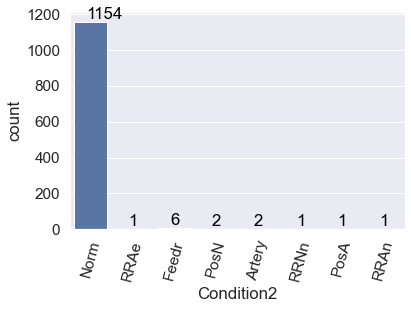

In [282]:
s=sns.countplot(train_df["Condition2"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [283]:
c2_pivot=train_df.pivot_table(index="Condition2",values="SalePrice",aggfunc=np.median)
c2_pivot

,SalePrice
Condition2,
Artery,106500
Feedr,127500
Norm,164350
PosA,325000
PosN,284875
RRAe,190000
RRAn,136905
RRNn,125000


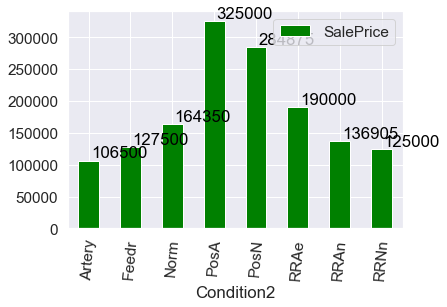

In [284]:
s=c2_pivot.plot(kind='bar',color='green')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

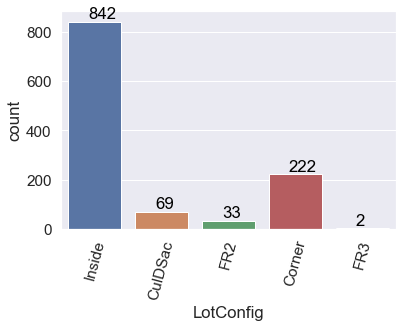

In [285]:
s=sns.countplot(train_df["LotConfig"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [286]:
lc_pivot=train_df.pivot_table(index="LotConfig",values="SalePrice",aggfunc=np.median)
lc_pivot

,SalePrice
LotConfig,
Corner,161000
CulDSac,211000
FR2,160000
FR3,221500
Inside,160000


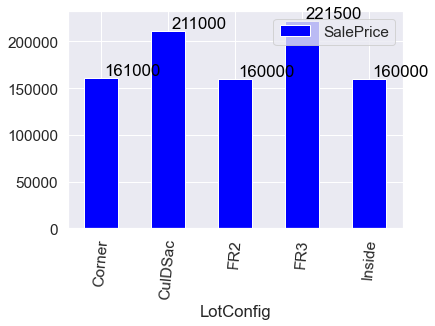

In [287]:
s=lc_pivot.plot(kind='bar',color='blue')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

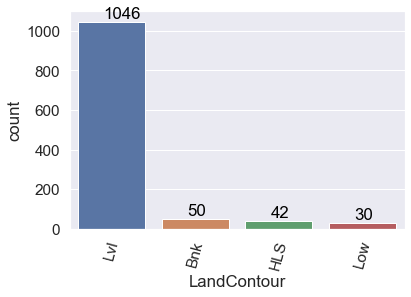

In [288]:
s=sns.countplot(train_df["LandContour"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [289]:
lc_pivot=train_df.pivot_table(index="LandContour",values="SalePrice",aggfunc=np.median)
lc_pivot

,SalePrice
LandContour,
Bnk,139700
HLS,194500
Low,186250
Lvl,163995


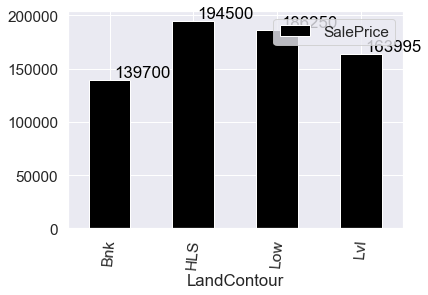

In [290]:
s=lc_pivot.plot(kind='bar',color='black')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

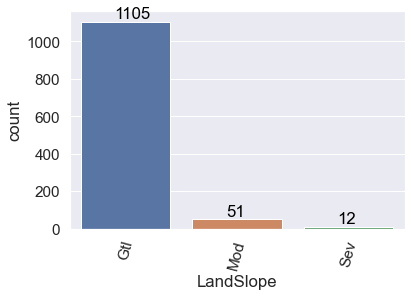

In [291]:
s=sns.countplot(train_df["LandSlope"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [292]:
ls_pivot=train_df.pivot_table(index="LandSlope",values="SalePrice",aggfunc=np.median)
ls_pivot

,SalePrice
LandSlope,
Gtl,163000
Mod,170000
Sev,182500


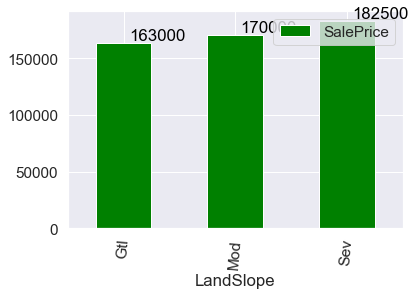

In [293]:
s=ls_pivot.plot(kind='bar',color='green')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

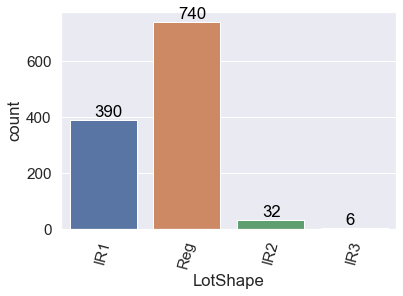

In [294]:
s=sns.countplot(train_df["LotShape"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [295]:
los_pivot=train_df.pivot_table(index="LotShape",values="SalePrice",aggfunc=np.median)
los_pivot

,SalePrice
LotShape,
IR1,188850
IR2,204000
IR3,237000
Reg,147000


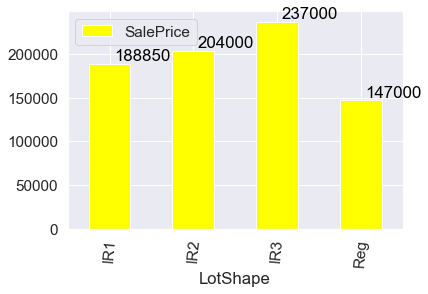

In [296]:
s=los_pivot.plot(kind='bar',color='yellow')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

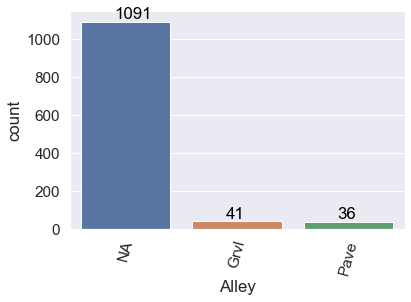

In [297]:
s=sns.countplot(train_df["Alley"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [298]:
al_pivot=train_df.pivot_table(index="Alley",values="SalePrice",aggfunc=np.median)
al_pivot

,SalePrice
Alley,
Grvl,124000
NA,165500
Pave,172500


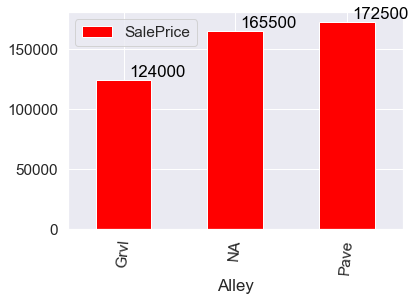

In [299]:
s=al_pivot.plot(kind='bar',color='red')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

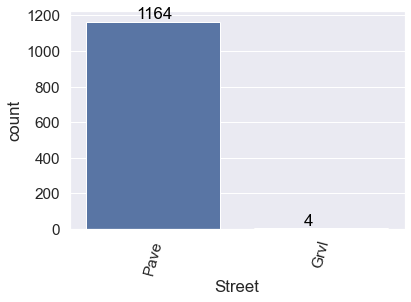

In [300]:
s=sns.countplot(train_df["Street"])
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=75);

In [301]:
s_pivot=train_df.pivot_table(index="Street",values="SalePrice",aggfunc=np.median)
s_pivot

,SalePrice
Street,
Grvl,99750
Pave,164000


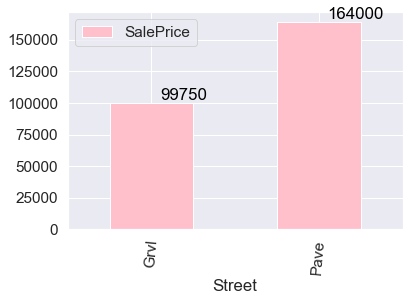

In [302]:
s=s_pivot.plot(kind='bar',color='pink')
for p in s.patches:
    s.annotate(int(p.get_height()),(p.get_x()+0.30,p.get_height()+1),va="bottom",color="black")
s.set_xticklabels(s.get_xticklabels(),rotation=85);

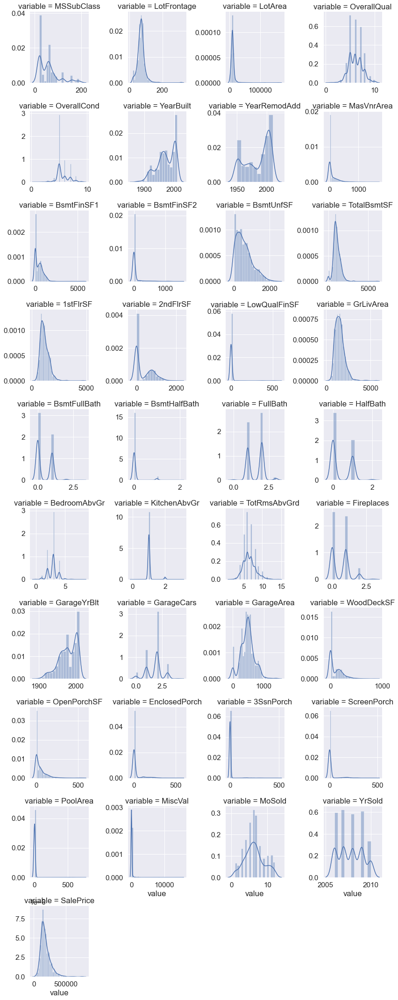

In [303]:
num = [f for f in train_df.columns if train_df.dtypes[f] != 'object']
num.remove('Id')
nd = pd.melt(train_df, value_vars = num)
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1


**As we can see that lot of columns having right skeewed.**

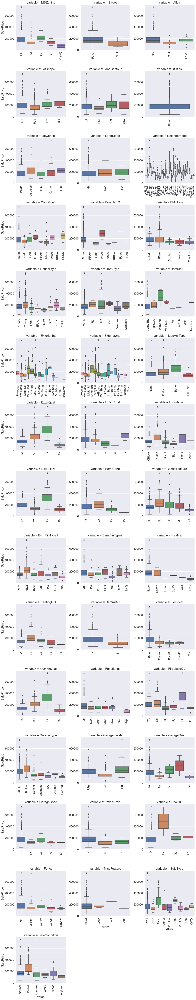

In [304]:
def boxplot(x,y,**kwargs):
            sns.boxplot(x=x,y=y)
            x = plt.xticks(rotation=90)

cat = [f for f in train_df.columns if train_df.dtypes[f] == 'object']

p = pd.melt(train_df, id_vars='SalePrice', value_vars=cat)
g = sns.FacetGrid (p, col='variable', col_wrap=3, sharex=False, sharey=False, size=5)
g = g.map(boxplot, 'value','SalePrice')
g


**As we can see there are lot of outliers in train dataset.**

# 10. Checking outliers in Dataset

## Train Dataset

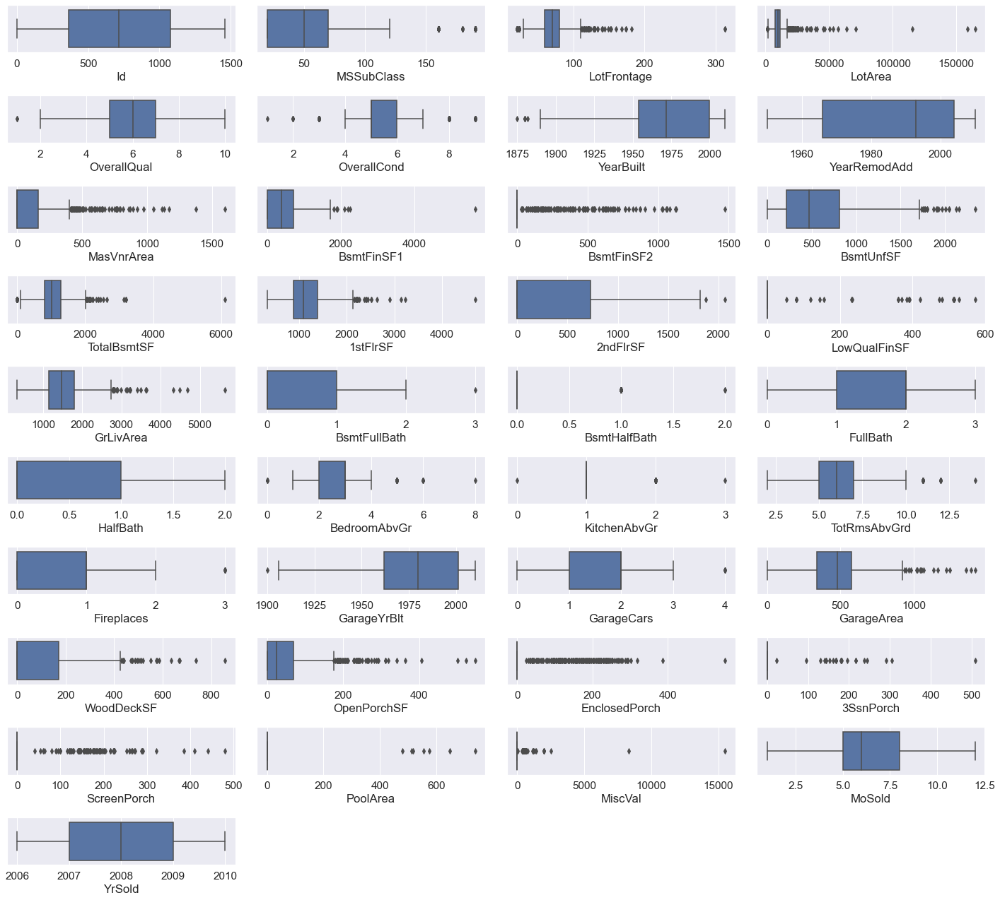

In [305]:
plt.figure(figsize=(20,18),facecolor="white")
plotnumber=1
for i in train_numeric_feat:
    if plotnumber <=37:
        ax=plt.subplot(10,4,plotnumber)
        sns.boxplot(train_df[i])
    plotnumber+=1
plt.tight_layout()

## Test Dataset

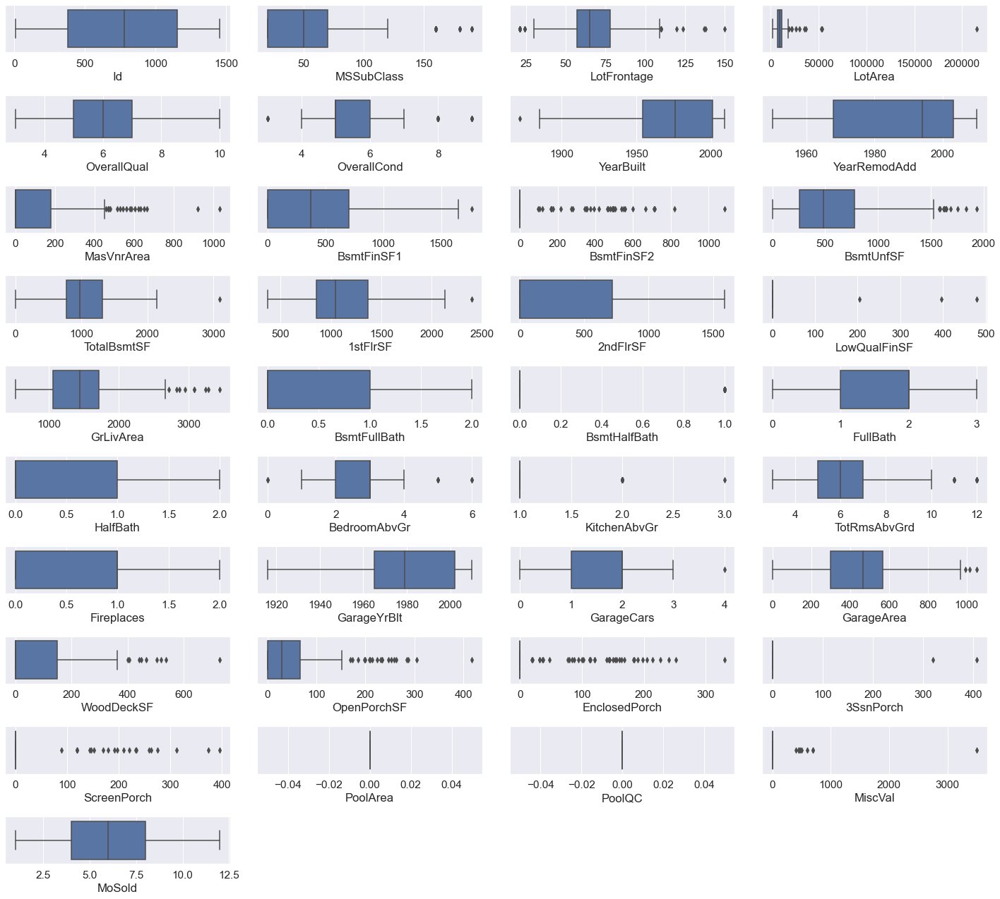

In [306]:
plt.figure(figsize=(20,18),facecolor="white")
plotnumber=1
for i in test_numeric_feat:
    if plotnumber <=37:
        ax=plt.subplot(10,4,plotnumber)
        sns.boxplot(test_df[i])
    plotnumber+=1
plt.tight_layout()

# 12. Checking skeweed data

## Train Data

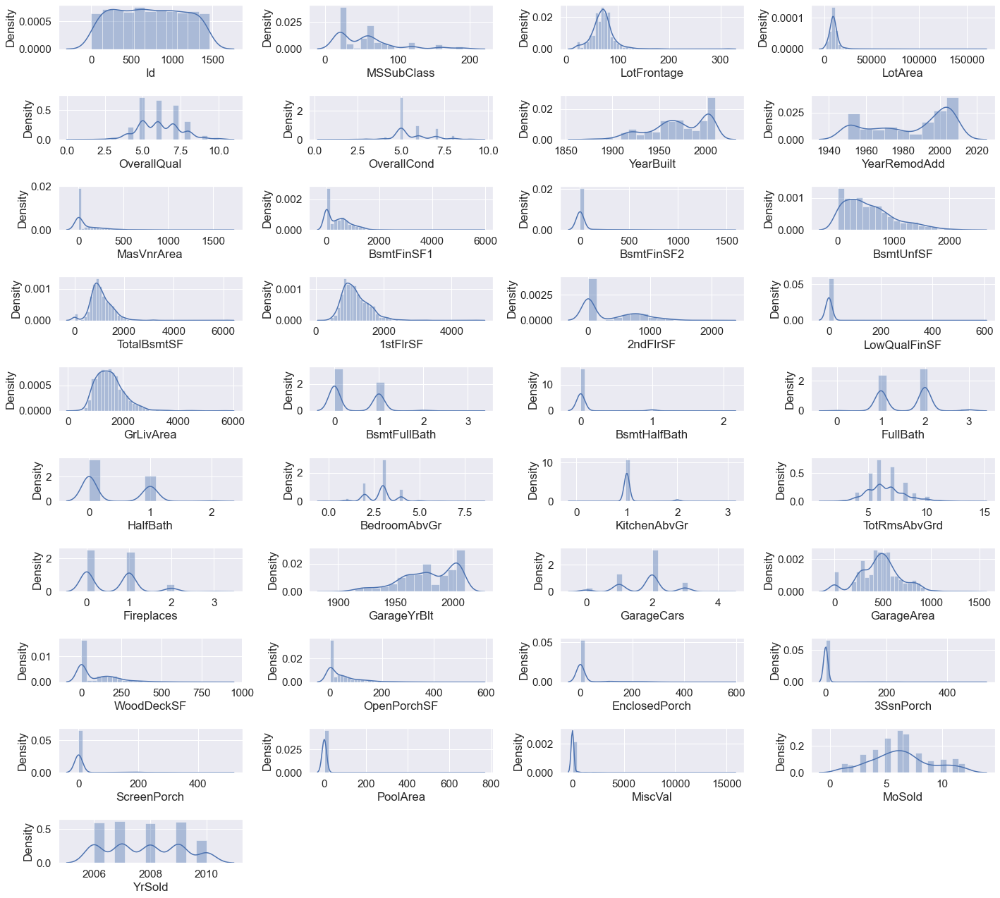

In [307]:
plt.figure(figsize=(20,18),facecolor="white")
plotnumber=1
for i in train_numeric_feat:
    if plotnumber <=37:
        ax=plt.subplot(10,4,plotnumber)
        sns.distplot(train_df[i])
    plotnumber+=1
plt.tight_layout()

In [308]:
train_df.skew()

Id                0.026526
MSSubClass        1.422019
LotFrontage       2.514055
LotArea          10.659285
OverallQual       0.175082
OverallCond       0.580714
YearBuilt        -0.579204
YearRemodAdd     -0.495864
MasVnrArea        2.835718
BsmtFinSF1        1.871606
BsmtFinSF2        4.365829
BsmtUnfSF         0.909057
TotalBsmtSF       1.744591
1stFlrSF          1.513707
2ndFlrSF          0.823479
LowQualFinSF      8.666142
GrLivArea         1.449952
BsmtFullBath      0.627106
BsmtHalfBath      4.264403
FullBath          0.057809
HalfBath          0.656492
BedroomAbvGr      0.243855
KitchenAbvGr      4.365259
TotRmsAbvGrd      0.644657
Fireplaces        0.671966
GarageYrBlt      -0.674913
GarageCars       -0.358556
GarageArea        0.189665
WoodDeckSF        1.504929
OpenPorchSF       2.410840
EnclosedPorch     3.043610
3SsnPorch         9.770611
ScreenPorch       4.105741
PoolArea         13.243711
MiscVal          23.065943
MoSold            0.220979
YrSold            0.115765
S

## Test Dataset

In [309]:
test_df.skew()

Id               -0.108806
MSSubClass        1.358597
LotFrontage       0.386942
LotArea          12.781805
OverallQual       0.397312
OverallCond       1.209714
YearBuilt        -0.755233
YearRemodAdd     -0.535600
MasVnrArea        1.978463
BsmtFinSF1        0.739790
BsmtFinSF2        3.698543
BsmtUnfSF         0.960708
TotalBsmtSF       0.519257
1stFlrSF          0.692047
2ndFlrSF          0.765511
LowQualFinSF     10.929928
GrLivArea         1.010586
BsmtFullBath      0.463685
BsmtHalfBath      3.544994
FullBath         -0.049800
HalfBath          0.758892
BedroomAbvGr      0.075315
KitchenAbvGr      4.849432
TotRmsAbvGrd      0.805535
Fireplaces        0.540164
GarageYrBlt      -0.677213
GarageCars       -0.280324
GarageArea        0.133547
WoodDeckSF        1.708221
OpenPorchSF       2.185030
EnclosedPorch     3.177046
3SsnPorch        12.277476
ScreenPorch       4.182351
PoolArea          0.000000
PoolQC            0.000000
MiscVal          13.264758
MoSold            0.186504
Y

# 13. Dealing with Skeewness of dataset

## Train Dataset

In [310]:
numeric_features = [f for f in train_df.columns if train_df[f].dtype != object]
numeric_features.remove("SalePrice")

In [311]:
from scipy.stats import skew
skewed = train_df[numeric_features].apply(lambda x: skew(x.dropna().astype(float)))
skewed = skewed[skewed > 0.75]
skewed = skewed.index
train_df[skewed] = np.log1p(train_df[skewed])

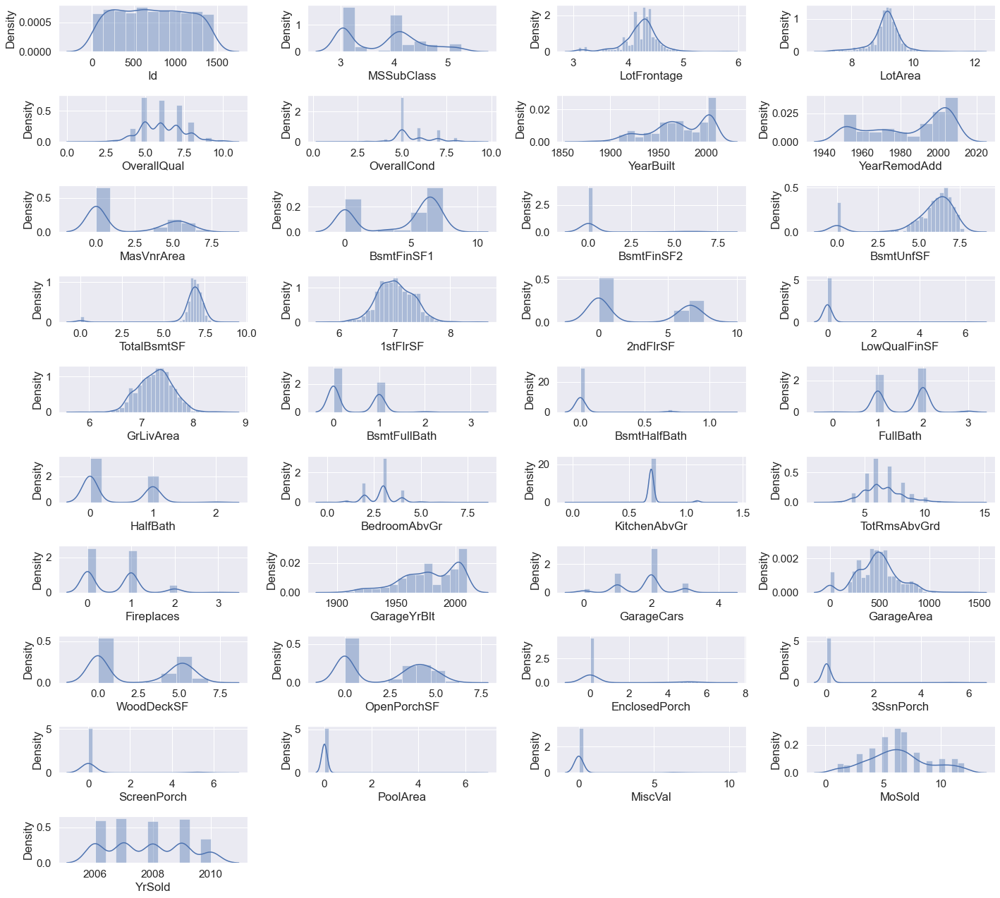

In [312]:
plt.figure(figsize=(20,18),facecolor="white")
plotnumber=1
for i in train_numeric_feat:
    if plotnumber <=37:
        ax=plt.subplot(10,4,plotnumber)
        sns.distplot(train_df[i])
    plotnumber+=1
plt.tight_layout()

## Test Dataset

In [313]:
numeric_features = [f for f in test_df.columns if test_df[f].dtype != object]

from scipy.stats import skew
skewed = test_df[numeric_features].apply(lambda x: skew(x.dropna().astype(float)))
skewed = skewed[skewed > 0.75]
skewed = skewed.index
test_df[skewed] = np.log1p(test_df[skewed])

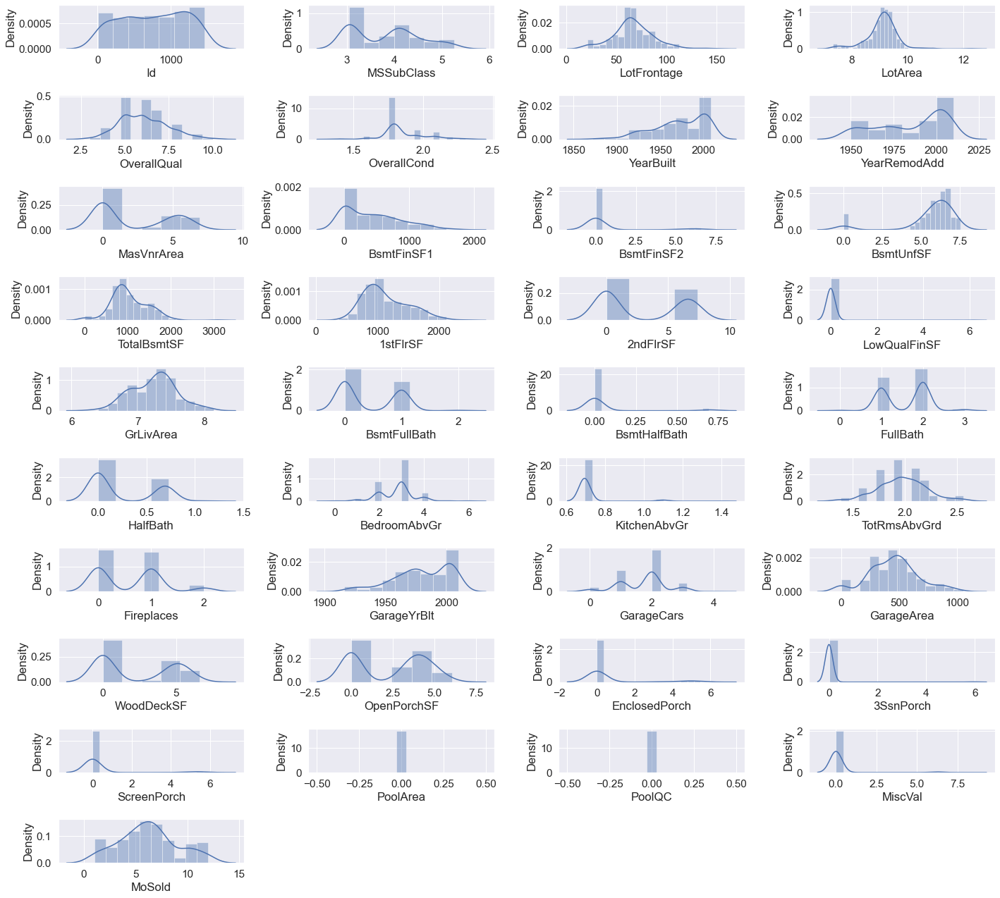

In [314]:
plt.figure(figsize=(20,18),facecolor="white")
plotnumber=1
for i in test_numeric_feat:
    if plotnumber <=37:
        ax=plt.subplot(10,4,plotnumber)
        sns.distplot(test_df[i])
    plotnumber+=1
plt.tight_layout()

# 13. Feature Transformation for Categorical columns

In [315]:
train_df.shape

(1168, 81)

In [316]:
test_df.shape

(292, 80)

In [317]:
all_data=train_df.append(test_df)

In [318]:
all_data.shape

(1460, 81)

In [319]:
all_data.reset_index(drop=True,inplace=True)

In [320]:
all_data.shape

(1460, 81)

In [321]:
cat = [f for f in all_data.columns if all_data.dtypes[f] == 'object']

In [322]:
print(cat,end="")

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']

In [323]:
all_data["MSZoning"].value_counts()

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [324]:
all_data["MSZoning"] = all_data["MSZoning"].map({"RL": 1, "RM": 0, "FV": 0, "RH": 0,"C (all)":0}).astype(int)

In [325]:
all_data["MSZoning"].value_counts()

1    1151
0     309
Name: MSZoning, dtype: int64

In [326]:
all_data["Street"].value_counts()

Pave    1454
Grvl       6
Name: Street, dtype: int64

In [327]:
all_data["Street"] = all_data["Street"].map({"Pave": 1, "Grvl": 0}).astype(int)

In [328]:
all_data["Street"].value_counts()

1    1454
0       6
Name: Street, dtype: int64

In [329]:
all_data["Alley"].value_counts()

NA      1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

In [330]:
all_data["Alley"] = all_data["Alley"].map({"NA": 1, "Grvl": 0,"Pave":0}).astype(int)

In [331]:
all_data["Alley"].value_counts()

1    1369
0      91
Name: Alley, dtype: int64

In [332]:
all_data["LotShape"].value_counts()

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64

In [333]:
from sklearn.preprocessing import OneHotEncoder

In [334]:
onehotencoder=OneHotEncoder()

In [335]:
x=onehotencoder.fit_transform(all_data.LotShape.values.reshape(-1,1)).toarray()

In [336]:
j=all_data["LotShape"].value_counts()

In [337]:
dfonehot=pd.DataFrame(x,columns=["LotShape_"+str(i)for i in j.index])

In [338]:
all_data=pd.concat([all_data,dfonehot],axis=1)

In [339]:
all_data.drop("LotShape",axis=1,inplace=True)

In [340]:
all_data["LandContour"].value_counts()

Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64

In [341]:
all_data["LandContour"] = all_data["LandContour"].map({"Lvl": 1, "Bnk": 0,"HLS":0,"Low":0}).astype(int)

In [342]:
all_data["LandContour"].value_counts()

1    1311
0     149
Name: LandContour, dtype: int64

In [343]:
all_data["Utilities"].value_counts()

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

In [344]:
all_data["Utilities"] = all_data["Utilities"].map({"AllPub": 1, "NoSeWa": 0}).astype(int)

In [345]:
all_data["Utilities"].value_counts()

1    1459
0       1
Name: Utilities, dtype: int64

In [346]:
all_data["LotConfig"].value_counts()

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [347]:
all_data["LotConfig"] = all_data["LotConfig"].map({"Inside": 1, "Corner": 0,"CulDSac":0,"FR2":0,"FR3":0}).astype(int)

In [348]:
all_data["LotConfig"].value_counts()

1    1052
0     408
Name: LotConfig, dtype: int64

In [349]:
all_data["LandSlope"].value_counts()

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

In [350]:
all_data["LandSlope"] = all_data["LandSlope"].map({"Gtl": 1, "Mod": 0,"Sev":0}).astype(int)

In [351]:
all_data["LandSlope"].value_counts()

1    1382
0      78
Name: LandSlope, dtype: int64

In [352]:
all_data["Neighborhood"].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

<AxesSubplot:xlabel='Neighborhood'>

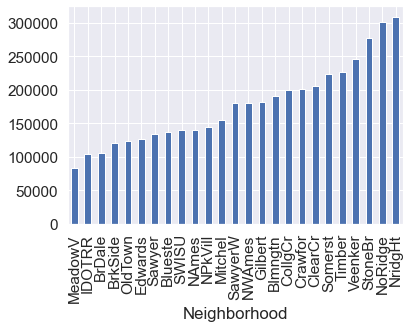

In [353]:
train_df['SalePrice'].groupby(train_df['Neighborhood']).median().sort_values().plot(kind='bar')

In [354]:
neighborhood_map = {"MeadowV" : 0, "IDOTRR" : 1, "BrDale" : 1, "OldTown" : 1, "Edwards" : 1, "BrkSide" : 1, "Sawyer" : 1, "Blueste" : 1, "SWISU" : 2, "NAmes" : 2, "NPkVill" : 2, "Mitchel" : 2, "SawyerW" : 2, "Gilbert" : 2, "NWAmes" : 2, "Blmngtn" : 2, "CollgCr" : 2, "ClearCr" : 3, "Crawfor" : 3, "Veenker" : 3, "Somerst" : 3, "Timber" : 3, "StoneBr" : 4, "NoRidge" : 4, "NridgHt" : 4}

In [355]:
all_data["Neighborhood"] = all_data["Neighborhood"].map(neighborhood_map).astype(int)

In [356]:
all_data["Neighborhood"].value_counts()

2    686
1    400
3    214
4    143
0     17
Name: Neighborhood, dtype: int64

In [357]:
all_data["Condition1"].value_counts()

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64

In [358]:
all_data["Condition1"] = all_data["Condition1"].map({"Norm": 1, "Feedr": 0,"Artery":0,"RRAn":0,"PosN":0,"RRAe":0,"PosA":0,"RRNn":0,"RRNe":0}).astype(int)

In [359]:
all_data["Condition1"].value_counts()

1    1260
0     200
Name: Condition1, dtype: int64

In [360]:
all_data["Condition2"].value_counts()

Norm      1445
Feedr        6
RRNn         2
Artery       2
PosN         2
PosA         1
RRAe         1
RRAn         1
Name: Condition2, dtype: int64

In [361]:
all_data["Condition2"] = all_data["Condition2"].map({"Norm": 1, "Feedr": 0,"Artery":0,"RRAn":0,"PosN":0,"RRAe":0,"PosA":0,"RRNn":0,"RRNe":0}).astype(int)

In [362]:
all_data["Condition2"].value_counts()

1    1445
0      15
Name: Condition2, dtype: int64

In [363]:
all_data["BldgType"].value_counts()

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64

In [364]:
all_data["BldgType"] = all_data["BldgType"].map({"1Fam": 1, "TwnhsE": 0,"Duplex":0,"Twnhs":0,"2fmCon":0}).astype(int)

In [365]:
all_data["BldgType"].value_counts()

1    1220
0     240
Name: BldgType, dtype: int64

In [366]:
all_data["HouseStyle"].value_counts()

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

In [367]:
x=onehotencoder.fit_transform(all_data.HouseStyle.values.reshape(-1,1)).toarray()
j=all_data["HouseStyle"].value_counts()
dfonehot=pd.DataFrame(x,columns=["HouseStyle_"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("HouseStyle",axis=1,inplace=True)

In [368]:
all_data["RoofStyle"].value_counts()

Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64

In [369]:
all_data["RoofStyle"] = all_data["RoofStyle"].map({"Gable": 1, "Hip": 0,"Flat":0,"Gambrel":0,"Mansard":0,"Shed":0}).astype(int)

In [370]:
all_data["RoofStyle"].value_counts()

1    1141
0     319
Name: RoofStyle, dtype: int64

In [371]:
all_data["Exterior1st"].value_counts()

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
CBlock       1
AsphShn      1
ImStucc      1
Name: Exterior1st, dtype: int64

In [372]:
x=onehotencoder.fit_transform(all_data.Exterior1st.values.reshape(-1,1)).toarray()
j=all_data["Exterior1st"].value_counts()
dfonehot=pd.DataFrame(x,columns=["Exterior1st"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("Exterior1st",axis=1,inplace=True)

In [373]:
all_data["Exterior2nd"].value_counts()

VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
CBlock       1
Other        1
Name: Exterior2nd, dtype: int64

In [374]:
x=onehotencoder.fit_transform(all_data.Exterior2nd.values.reshape(-1,1)).toarray()
j=all_data["Exterior2nd"].value_counts()
dfonehot=pd.DataFrame(x,columns=["Exterior2nd"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("Exterior2nd",axis=1,inplace=True)

In [375]:
all_data["MasVnrType"].value_counts()

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [376]:
x=onehotencoder.fit_transform(all_data.MasVnrType.values.reshape(-1,1)).toarray()
j=all_data["MasVnrType"].value_counts()
dfonehot=pd.DataFrame(x,columns=["MasVnrType"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("MasVnrType",axis=1,inplace=True)

In [377]:
all_data["ExterQual"].value_counts()

TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64

In [378]:
from sklearn.preprocessing import OrdinalEncoder

In [379]:
enc=OrdinalEncoder(categories=[["Fa","TA","Gd","Ex"]])

In [380]:
z=enc.fit_transform(all_data.ExterQual.values.reshape(-1,1))

In [381]:
all_data["ExterQual"]=z

In [382]:
all_data["ExterQual"].value_counts()

1.0    906
2.0    488
3.0     52
0.0     14
Name: ExterQual, dtype: int64

In [383]:
all_data["BsmtQual"].value_counts()

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64

In [384]:
enc=OrdinalEncoder(categories=[["Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.BsmtQual.values.reshape(-1,1))
all_data["BsmtQual"]=z

In [385]:
all_data["BsmtQual"].value_counts()

1.0    686
2.0    618
3.0    121
0.0     35
Name: BsmtQual, dtype: int64

In [386]:
all_data["BsmtCond"].value_counts()

TA    1348
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64

In [387]:
enc=OrdinalEncoder(categories=[["Po","Fa","TA","Gd"]])
z=enc.fit_transform(all_data.BsmtCond.values.reshape(-1,1))
all_data["BsmtCond"]=z

In [388]:
all_data["BsmtCond"].value_counts()

2.0    1348
3.0      65
1.0      45
0.0       2
Name: BsmtCond, dtype: int64

In [389]:
all_data["KitchenQual"].value_counts()

TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64

In [390]:
enc=OrdinalEncoder(categories=[["Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.KitchenQual.values.reshape(-1,1))
all_data["KitchenQual"]=z

In [391]:
all_data["KitchenQual"].value_counts()

1.0    735
2.0    586
3.0    100
0.0     39
Name: KitchenQual, dtype: int64

In [392]:
all_data["GarageQual"].value_counts()

TA    1392
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64

In [393]:
enc=OrdinalEncoder(categories=[["Po","Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.GarageQual.values.reshape(-1,1))
all_data["GarageQual"]=z

In [394]:
all_data["GarageQual"].value_counts()

2.0    1392
1.0      48
3.0      14
0.0       3
4.0       3
Name: GarageQual, dtype: int64

In [395]:
all_data["GarageCond"].value_counts()

TA    1407
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64

In [396]:
enc=OrdinalEncoder(categories=[["Po","Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.GarageCond.values.reshape(-1,1))
all_data["GarageCond"]=z

In [397]:
all_data["GarageCond"].value_counts()

2.0    1407
1.0      35
3.0       9
0.0       7
4.0       2
Name: GarageCond, dtype: int64

In [398]:
all_data["PoolQC"].value_counts()

0     1453
Gd       3
Ex       2
Fa       2
Name: PoolQC, dtype: int64

In [399]:
enc=OrdinalEncoder(categories=[[0,"Fa","Gd","Ex"]])
z=enc.fit_transform(all_data.PoolQC.values.reshape(-1,1))
all_data["PoolQC"]=z

In [400]:
all_data["PoolQC"].value_counts()

0.0    1453
2.0       3
3.0       2
1.0       2
Name: PoolQC, dtype: int64

In [401]:
all_data["ExterCond"].value_counts()

TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64

In [402]:
enc=OrdinalEncoder(categories=[["Po","Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.ExterCond.values.reshape(-1,1))
all_data["ExterCond"]=z

In [403]:
all_data["ExterCond"].value_counts()

2.0    1282
3.0     146
1.0      28
4.0       3
0.0       1
Name: ExterCond, dtype: int64

In [404]:
all_data["Foundation"].value_counts()

PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64

In [405]:
x=onehotencoder.fit_transform(all_data.Foundation.values.reshape(-1,1)).toarray()
j=all_data["Foundation"].value_counts()
dfonehot=pd.DataFrame(x,columns=["Foundation"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("Foundation",axis=1,inplace=True)

In [406]:
all_data["BsmtExposure"].value_counts()

No    953
Av    221
Gd    134
Mn    114
NA     38
Name: BsmtExposure, dtype: int64

In [407]:
enc=OrdinalEncoder(categories=[["NA","No","Mn","Av","Gd"]])
z=enc.fit_transform(all_data.BsmtExposure.values.reshape(-1,1))
all_data["BsmtExposure"]=z

In [408]:
all_data["BsmtFinType1"].value_counts()

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NA      37
Name: BsmtFinType1, dtype: int64

In [409]:
x=onehotencoder.fit_transform(all_data.BsmtFinType1.values.reshape(-1,1)).toarray()
j=all_data["BsmtFinType1"].value_counts()
dfonehot=pd.DataFrame(x,columns=["BsmtFinType1_"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("BsmtFinType1",axis=1,inplace=True)

In [410]:
all_data["BsmtFinType2"].value_counts()

Unf    1256
Rec      54
LwQ      46
NA       38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [411]:
x=onehotencoder.fit_transform(all_data.BsmtFinType2.values.reshape(-1,1)).toarray()
j=all_data["BsmtFinType2"].value_counts()
dfonehot=pd.DataFrame(x,columns=["BsmtFinType2"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("BsmtFinType2",axis=1,inplace=True)

In [412]:
all_data["Heating"].value_counts()

GasA     1428
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: Heating, dtype: int64

In [413]:
all_data["Heating"] = all_data["Heating"].map({"GasA": 1, "GasW": 0,"Grav":0,"Wall":0,"OthW":0,"Floor":0}).astype(int)

In [414]:
all_data["Heating"].value_counts()

1    1428
0      32
Name: Heating, dtype: int64

In [415]:
all_data["HeatingQC"].value_counts()

Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64

In [416]:
enc=OrdinalEncoder(categories=[["Po","Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.HeatingQC.values.reshape(-1,1))
all_data["HeatingQC"]=z

In [417]:
all_data["CentralAir"].value_counts()

Y    1365
N      95
Name: CentralAir, dtype: int64

In [418]:
from sklearn.preprocessing import LabelEncoder

In [419]:
lc=LabelEncoder()

In [420]:
z=lc.fit_transform(all_data.CentralAir.values.reshape(-1,1))
all_data["CentralAir"]=z

In [421]:
all_data["CentralAir"].value_counts()

1    1365
0      95
Name: CentralAir, dtype: int64

In [422]:
all_data["Electrical"].value_counts()

SBrkr    1335
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [423]:
all_data["Electrical"] = all_data["Electrical"].map({"SBrkr": 1, "FuseA": 0,"FuseF":0,"FuseP":0,"Mix":0}).astype(int)

In [424]:
all_data["Electrical"].value_counts()

1    1335
0     125
Name: Electrical, dtype: int64

In [425]:
all_data["Functional"].value_counts()

Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64

In [426]:
all_data["Functional"] = all_data["Functional"].map({"Typ": 1, "Min2": 0,"Min1":0,"Mod":0,"Maj1":0,"Maj2":0,"Sev":0}).astype(int)

In [427]:
all_data["Functional"].value_counts()

1    1360
0     100
Name: Functional, dtype: int64

In [428]:
all_data["FireplaceQu"].value_counts()

NA    690
Gd    380
TA    313
Fa     33
Ex     24
Po     20
Name: FireplaceQu, dtype: int64

In [429]:
enc=OrdinalEncoder(categories=[["NA","Po","Fa","TA","Gd","Ex"]])
z=enc.fit_transform(all_data.FireplaceQu.values.reshape(-1,1))
all_data["FireplaceQu"]=z

In [430]:
all_data["FireplaceQu"].value_counts()

0.0    690
4.0    380
3.0    313
2.0     33
5.0     24
1.0     20
Name: FireplaceQu, dtype: int64

In [431]:
all_data["GarageType"].value_counts()

Attchd     870
Detchd     387
BuiltIn     88
NA          81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [432]:
x=onehotencoder.fit_transform(all_data.GarageType.values.reshape(-1,1)).toarray()
j=all_data["GarageType"].value_counts()
dfonehot=pd.DataFrame(x,columns=["GarageType"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("GarageType",axis=1,inplace=True)

In [433]:
all_data["GarageFinish"].value_counts()

Unf    686
RFn    422
Fin    352
Name: GarageFinish, dtype: int64

In [434]:
x=onehotencoder.fit_transform(all_data.GarageFinish.values.reshape(-1,1)).toarray()
j=all_data["GarageFinish"].value_counts()
dfonehot=pd.DataFrame(x,columns=["GarageFinish_"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("GarageFinish",axis=1,inplace=True)

In [435]:
all_data["PavedDrive"].value_counts()

Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64

In [436]:
all_data["PavedDrive"] = all_data["PavedDrive"].map({"Y": 1, "N": 0,"P":0}).astype(int)

In [437]:
all_data["PavedDrive"].value_counts()

1    1340
0     120
Name: PavedDrive, dtype: int64

In [438]:
all_data["Fence"].value_counts()

NA       1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

In [439]:
x=onehotencoder.fit_transform(all_data.Fence.values.reshape(-1,1)).toarray()
j=all_data["Fence"].value_counts()
dfonehot=pd.DataFrame(x,columns=["Fence_"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("Fence",axis=1,inplace=True)

In [440]:
all_data["MiscFeature"].value_counts()

Shed    1455
Othr       2
Gar2       2
TenC       1
Name: MiscFeature, dtype: int64

In [441]:
all_data["MiscFeature"] = all_data["MiscFeature"].map({"Shed": 1, "Gar2": 0,"Othr":0,"TenC":0}).astype(int)

In [442]:
all_data["MiscFeature"].value_counts()

1    1455
0       5
Name: MiscFeature, dtype: int64

In [443]:
all_data["SaleType"].value_counts()

WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64

In [444]:
all_data["SaleType"] = all_data["SaleType"].map({"WD": 1, "New": 1,"COD":0,"ConLD":0,"ConLw":0,"ConLI":0,"CWD":0,"Oth":0,"Con":0}).astype(int)

In [445]:
all_data["SaleType"].value_counts()

1    1389
0      71
Name: SaleType, dtype: int64

In [446]:
all_data["SaleCondition"].value_counts()

Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64

In [447]:
x=onehotencoder.fit_transform(all_data.SaleCondition.values.reshape(-1,1)).toarray()
j=all_data["SaleCondition"].value_counts()
dfonehot=pd.DataFrame(x,columns=["SaleCondition_"+str(i)for i in j.index])
all_data=pd.concat([all_data,dfonehot],axis=1)
all_data.drop("SaleCondition",axis=1,inplace=True)

In [448]:
all_data["RoofMatl"].value_counts()

CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Roll          1
Metal         1
Membran       1
ClyTile       1
Name: RoofMatl, dtype: int64

In [449]:
all_data["RoofMatl"] = all_data["RoofMatl"].map({"CompShg": 1, "Tar&Grv": 0,"WdShngl":0,"WdShake":0,"ClyTile":0,"Metal":0,"Membran":0,"Roll":0}).astype(int)

In [450]:
all_data["RoofMatl"].value_counts()

1    1434
0      26
Name: RoofMatl, dtype: int64

In [451]:
train_new = all_data[all_data['SalePrice'].notnull()]
test_new = all_data[all_data['SalePrice'].isnull()]

In [452]:
test_new.drop("SalePrice",inplace=True,axis=1)

In [453]:
print("Train dataset shape:",train_new.shape)
print("*"*30)
print("Test dataset shape:",test_new.shape)

Train dataset shape: (1168, 157)
******************************
Test dataset shape: (292, 156)


# 14. Checking Target Variable Distribution

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

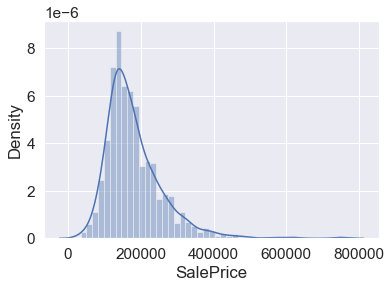

In [454]:
sns.distplot(train_new["SalePrice"])

**As we can see that target variable is not normal distribution and having right skeweed.**

In [455]:
train_new["SalePrice"]=np.log(train_new["SalePrice"])

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

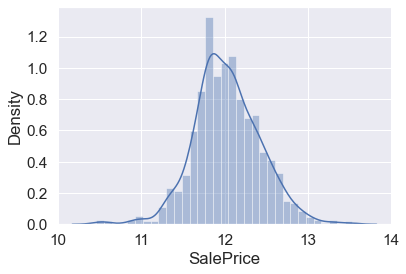

In [456]:
sns.distplot(train_new["SalePrice"])

# 15 Spliting training dataset

In [457]:
x=train_new.drop("SalePrice",axis=1)

In [458]:
y=train_new["SalePrice"]

In [459]:
x.shape

(1168, 156)

In [460]:
y.shape

(1168,)

# 16. Feature Transformation with Standard Scaler

In [461]:
from sklearn.preprocessing import StandardScaler

In [462]:
scaler=StandardScaler()

In [463]:
x_scaled=scaler.fit_transform(x)

In [464]:
x_scaled.shape

(1168, 156)

In [465]:
x_scaled

array([[-1.43548658,  1.42570841,  0.50854763, ..., -0.12510865,
         0.48577653, -0.31919711],
       [ 0.39632483, -1.13127766,  0.50854763, ..., -0.12510865,
         0.48577653, -0.31919711],
       [ 0.16554544,  0.4256774 ,  0.50854763, ..., -0.12510865,
         0.48577653, -0.31919711],
       ...,
       [-1.26961389,  1.84272655,  0.50854763, ..., -0.12510865,
         0.48577653, -0.31919711],
       [-1.66626597,  0.64732585, -1.96638416, ..., -0.12510865,
         0.48577653, -0.31919711],
       [-0.25755011,  0.4256774 ,  0.50854763, ..., -0.12510865,
         0.48577653, -0.31919711]])

# 17. Feature Extracting with PCA

In [466]:
from sklearn.decomposition import PCA

In [467]:
pca=PCA()

In [468]:
principalcomponent=pca.fit_transform(x_scaled)

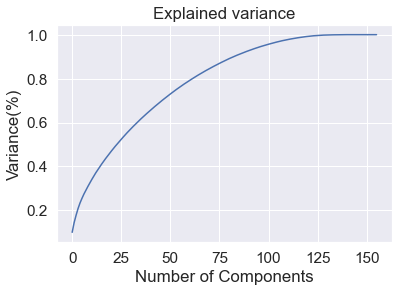

In [469]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Variance(%)")
plt.title("Explained variance")
plt.show()

**As we can see that 90 number of components explained more than 90% variance.**

In [470]:
pca=PCA(n_components=90)
new_data_pca=pca.fit_transform(x_scaled)

# 16 Model Building

## 16.1 Linear Regression

In [471]:
from sklearn.linear_model import LinearRegression

In [472]:
mlr=LinearRegression()

## 16.2 Choosing best random state

In [473]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
mlr=LinearRegression()
for i in range(2000,3000):
    x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=i)
    mlr.fit(x_train,y_train)
    pred_train=mlr.predict(x_train)
    pred_test=mlr.predict(x_test)
    
    if round(r2_score(y_train,pred_train)*100,1)==round(r2_score(y_test,pred_test)*100,1):
        print("At Random State",i,"Model perform well")
        print("At Random State",i)
        print("Training R2_score is-",r2_score(y_train,pred_train)*100)
        print("Testing R2_score is-",r2_score(y_test,pred_test)*100)

At Random State 2347 Model perform well
At Random State 2347
Training R2_score is- 91.33744780555946
Testing R2_score is- 91.27026543049665


**As we can choose best random state 2347.**

In [474]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=2347)

In [475]:
mlr.fit(x_train,y_train)

LinearRegression()

## 16.3 Evaluation Matrix

In [476]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [477]:
pred_test=mlr.predict(x_test)

In [478]:
MAE=mean_absolute_error(y_test,pred_test)

In [479]:
MAE

0.08262247519126195

In [480]:
RMSE=np.sqrt(mean_squared_error(y_test,pred_test))

In [481]:
RMSE

0.10986126172314514

In [482]:
mlr_score=r2_score(y_test,pred_test)

In [483]:
mlr_score

0.9127026543049666

In [484]:
mlr_MAE=mean_absolute_error(y_test,pred_test)

In [485]:
mlr_MAE

0.08262247519126195

## 16.4 Choosing Best CV for model

In [486]:
from sklearn.model_selection import cross_val_score

In [487]:
for j in range(2,15):
    mlr_score=cross_val_score(mlr,x_scaled,y,cv=j,scoring="r2")
    mlr_s=mlr_score.mean()
    print("AT CV :-",j)
    print("CV Score:",mlr_s*100)
    print("\n")

AT CV :- 2
CV Score: -4.815696768378052e+25


AT CV :- 3
CV Score: -1.177314665281759e+26


AT CV :- 4
CV Score: -4.942051276350299e+22


AT CV :- 5
CV Score: -2.109251548370896e+26


AT CV :- 6
CV Score: -1.2005659990931108e+26


AT CV :- 7
CV Score: -1.8957027983890129e+21


AT CV :- 8
CV Score: -1.9048291593963045e+24


AT CV :- 9
CV Score: -6.109318052896714e+23


AT CV :- 10
CV Score: -1.5735265914896183e+25


AT CV :- 11
CV Score: -3.420114933866456e+26


AT CV :- 12
CV Score: -1.8054358091484818e+25


AT CV :- 13
CV Score: -2.2067099801670127e+26


AT CV :- 14
CV Score: -5.336646947310888e+26




**We can see that linear regression model is not performing well as CV score is very bad, so we will check whether model is overfitting or underfitting.**

In [488]:
cross_val_score(mlr,x_scaled,y,cv=3)

array([-1.32154406e+24, -2.03344148e+24, -1.76958461e+23])

In [489]:
mlr_cv_score=cross_val_score(mlr,x_scaled,y,cv=3).mean()

In [490]:
mlr_cv_score

-1.177314665281759e+24

In [491]:
mlr_score=r2_score(y_test,pred_test)

In [492]:
mlr_score

0.9127026543049666

## 16.5 Checking for Overfitting or Underfitting for model

In [493]:
from sklearn.model_selection import KFold

In [494]:
kf = KFold(n_splits=15,shuffle=True) 
training_error = []
training_R2_Score = []
testing_error = []
testing_R2_Score = []
for train_index,test_index in kf.split(x_scaled): 
    x_train,x_test = x_scaled[train_index],x_scaled[test_index]
    y_train,y_test = y[train_index],y[test_index]
    mlr = LinearRegression()
    mlr.fit(x_train,y_train)
    train_data_pred = mlr.predict(x_train)
    test_data_pred = mlr.predict(x_test)
    training_error.append(mean_absolute_error(y_train,train_data_pred))
    testing_error.append(mean_absolute_error(y_test,test_data_pred))
    training_R2_Score.append(r2_score(y_train,train_data_pred))
    testing_R2_Score.append(r2_score(y_test,test_data_pred))

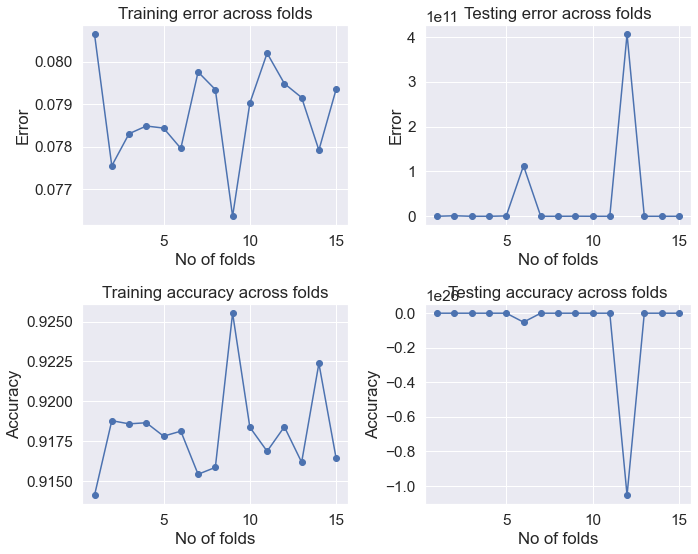

In [495]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Training error across folds')

plt.subplot(2,2,2)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Testing error across folds')

plt.subplot(2,2,3)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Training accuracy across folds')

plt.subplot(2,2,4)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Testing accuracy across folds')
plt.tight_layout()

# 17.1 Ridge Regression

In [496]:
from sklearn.linear_model import Ridge

In [497]:
ridge_model=Ridge()

In [498]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=2347)

In [499]:
ridge_model.fit(x_train,y_train)

Ridge()

## 17.2 Evaluation Matrix

In [500]:
pred_test=ridge_model.predict(x_test)

In [501]:
MAE=mean_absolute_error(y_test,pred_test)

In [502]:
MAE

0.08246348960621604

In [503]:
RMSE=np.sqrt(mean_squared_error(y_test,pred_test))

In [504]:
RMSE

0.10974871866009565

In [505]:
ridge_score=r2_score(y_test,pred_test)

In [506]:
ridge_score

0.9128814193811494

In [507]:
ridge_MAE=mean_absolute_error(y_test,pred_test)

In [508]:
ridge_MAE

0.08246348960621604

## 17.3 Choosing best CV for model

In [509]:
for j in range(2,15):
    ridge_model_score=cross_val_score(ridge_model,x_scaled,y,cv=j)
    ridge_model_s=ridge_model_score.mean()
    print("AT CV :-",j)
    print("CV Score:",ridge_model_s*100)
    print("\n")

AT CV :- 2
CV Score: 83.41674011014256


AT CV :- 3
CV Score: 84.50394705124421


AT CV :- 4
CV Score: 85.62392976999207


AT CV :- 5
CV Score: 85.72297503352593


AT CV :- 6
CV Score: 86.20943872480198


AT CV :- 7
CV Score: 85.24530116338819


AT CV :- 8
CV Score: 86.20946631828788


AT CV :- 9
CV Score: 85.47825069657235


AT CV :- 10
CV Score: 86.15634997240609


AT CV :- 11
CV Score: 85.83895032405493


AT CV :- 12
CV Score: 85.65468813052654


AT CV :- 13
CV Score: 85.99150621168515


AT CV :- 14
CV Score: 85.07818923810882




**As we can choose best CV 8 also we have observed that CV score has improved drastically in ridge regression becuase the model was overfitting which takes care when we apply regulation technique.**

In [510]:
cross_val_score(ridge_model,x_scaled,y,cv=8)

array([0.93022801, 0.90262494, 0.84640759, 0.86678821, 0.78370501,
       0.88645061, 0.8712027 , 0.80935024])

In [511]:
ridge_model_cv_score=cross_val_score(ridge_model,x_scaled,y,cv=8).mean()

In [512]:
ridge_model_cv_score

0.8620946631828788

In [513]:
ridge_score=r2_score(y_test,pred_test)

In [514]:
ridge_score

0.9128814193811494

## 17.4 Checking for Overfitting or Underfitting for model

In [515]:
kf = KFold(n_splits=15,shuffle=True) 
training_error = []
training_R2_Score = []
testing_error = []
testing_R2_Score = []
for train_index,test_index in kf.split(x_scaled): 
    x_train,x_test = x_scaled[train_index],x_scaled[test_index]
    y_train,y_test = y[train_index],y[test_index]
    ridge_model = Ridge()
    ridge_model.fit(x_train,y_train)
    train_data_pred = ridge_model.predict(x_train)
    test_data_pred = ridge_model.predict(x_test)
    training_error.append(mean_absolute_error(y_train,train_data_pred))
    testing_error.append(mean_absolute_error(y_test,test_data_pred))
    training_R2_Score.append(r2_score(y_train,train_data_pred))
    testing_R2_Score.append(r2_score(y_test,test_data_pred))

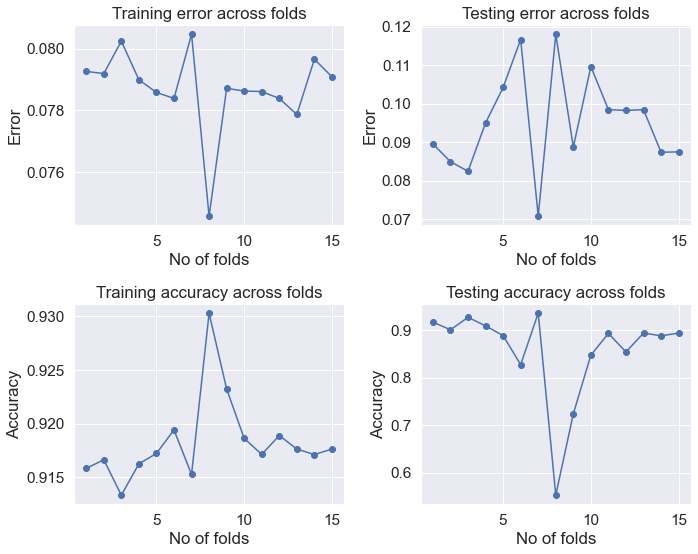

In [516]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Training error across folds')

plt.subplot(2,2,2)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Testing error across folds')

plt.subplot(2,2,3)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Training accuracy across folds')

plt.subplot(2,2,4)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Testing accuracy across folds')
plt.tight_layout()

# 18.1 Lasso Regression

In [517]:
from sklearn.linear_model import Lasso

In [518]:
lasso_model=Lasso()

In [519]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=2347)

In [520]:
lasso_model.fit(x_train,y_train)

Lasso()

## 18.2 Evaluation Matrix

In [521]:
pred_test=lasso_model.predict(x_test)

In [522]:
MAE=mean_absolute_error(y_test,pred_test)

In [523]:
MAE

0.2885092567076428

In [524]:
RMSE=np.sqrt(mean_squared_error(y_test,pred_test))

In [525]:
RMSE

0.3730450525769711

In [526]:
lasso_score=r2_score(y_test,pred_test)

In [527]:
lasso_score

-0.006547891435053188

In [528]:
lasso_MAE=mean_absolute_error(y_test,pred_test)

In [529]:
lasso_MAE

0.2885092567076428

## 18.3 Choosing Best CV

In [530]:
for j in range(2,15):
    lasso_model_score=cross_val_score(lasso_model,x_scaled,y,cv=j)
    lasso_model_s=lasso_model_score.mean()
    print("AT CV :-",j)
    print("CV Score:",lasso_model_s*100)
    print("\n")

AT CV :- 2
CV Score: -1.0829529697992557


AT CV :- 3
CV Score: -0.5398213969431447


AT CV :- 4
CV Score: -1.1486715530197311


AT CV :- 5
CV Score: -1.5078047578763698


AT CV :- 6
CV Score: -0.6300831288711988


AT CV :- 7
CV Score: -0.9085516537878544


AT CV :- 8
CV Score: -1.095916710150033


AT CV :- 9
CV Score: -0.8930435349897866


AT CV :- 10
CV Score: -1.4771955822073513


AT CV :- 11
CV Score: -1.0012768368044191


AT CV :- 12
CV Score: -1.9966546083683312


AT CV :- 13
CV Score: -1.5447970140019778


AT CV :- 14
CV Score: -1.560579997089143




In [531]:
cross_val_score(lasso_model,x_scaled,y,cv=3)

array([-0.00347866, -0.00190139, -0.01081459])

In [532]:
lasso_cv_score=cross_val_score(lasso_model,x_scaled,y,cv=3).mean()

In [533]:
lasso_cv_score

-0.005398213969431446

In [534]:
lasso_score

-0.006547891435053188

## 18.4 Checking for Overfitting or Underfitting for model

In [535]:
kf = KFold(n_splits=15,shuffle=True) 
training_error = []
training_R2_Score = []
testing_error = []
testing_R2_Score = []
for train_index,test_index in kf.split(x_scaled): 
    x_train,x_test = x_scaled[train_index],x_scaled[test_index]
    y_train,y_test = y[train_index],y[test_index]
    lasso_model = Lasso()
    lasso_model.fit(x_train,y_train)
    train_data_pred = lasso_model.predict(x_train)
    test_data_pred = lasso_model.predict(x_test)
    training_error.append(mean_absolute_error(y_train,train_data_pred))
    testing_error.append(mean_absolute_error(y_test,test_data_pred))
    training_R2_Score.append(r2_score(y_train,train_data_pred))
    testing_R2_Score.append(r2_score(y_test,test_data_pred))

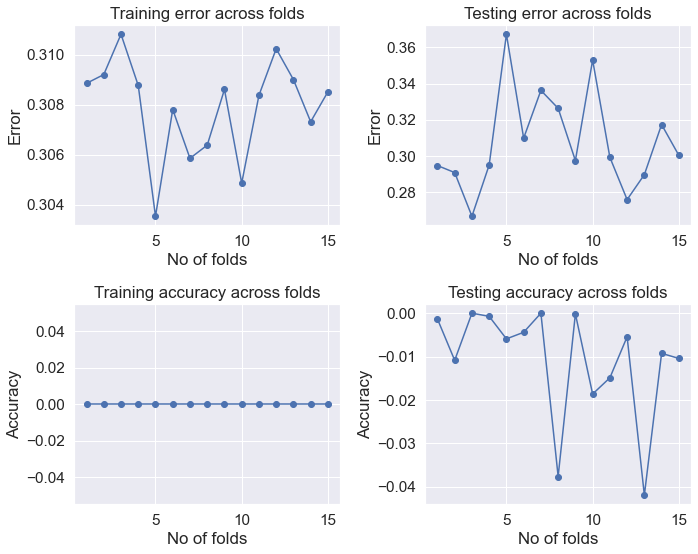

In [536]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Training error across folds')

plt.subplot(2,2,2)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Testing error across folds')

plt.subplot(2,2,3)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Training accuracy across folds')

plt.subplot(2,2,4)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Testing accuracy across folds')
plt.tight_layout()

# 19.1 Random Forest Regressor

In [537]:
from sklearn.ensemble import RandomForestRegressor

In [538]:
rfr=RandomForestRegressor()

In [539]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=2347)

In [540]:
rfr.fit(x_train,y_train)

RandomForestRegressor()

## 19.2 Evaluation Matrix

In [541]:
pred_test=rfr.predict(x_test)

In [542]:
MAE=mean_absolute_error(y_test,pred_test)

In [543]:
MAE

0.09016375794714632

In [544]:
RMSE=np.sqrt(mean_squared_error(y_test,pred_test))

In [545]:
RMSE

0.12732821546427125

In [546]:
rfr_score=r2_score(y_test,pred_test)

In [547]:
rfr_score

0.8827369519075688

In [548]:
rfr_MAE=mean_absolute_error(y_test,pred_test)

In [549]:
rfr_MAE

0.09016375794714632

## 19.3 Choosing Best CV

In [550]:
for j in range(2,15):
    rfr_score=cross_val_score(rfr,x_scaled,y,cv=j)
    rfr_s=rfr_score.mean()
    print("AT CV :-",j)
    print("CV Score:",rfr_s*100)
    print("\n")

AT CV :- 2
CV Score: 84.96970391028813


AT CV :- 3
CV Score: 86.22159738018857


AT CV :- 4
CV Score: 85.99718410564459


AT CV :- 5
CV Score: 85.9937808540002


AT CV :- 6
CV Score: 86.25516440481543


AT CV :- 7
CV Score: 86.44696373330852


AT CV :- 8
CV Score: 86.33387123776522


AT CV :- 9
CV Score: 86.36734242208495


AT CV :- 10
CV Score: 86.44376069796323


AT CV :- 11
CV Score: 86.07804473576846


AT CV :- 12
CV Score: 86.1956733388503


AT CV :- 13
CV Score: 86.18922624381362


AT CV :- 14
CV Score: 86.1825293960143




**As we can choose best CV 10.**

In [551]:
cross_val_score(rfr,x_scaled,y,cv=10)

array([0.88267864, 0.89412149, 0.89180038, 0.83219347, 0.89128955,
       0.81000882, 0.87094309, 0.89993626, 0.83117552, 0.81376384])

In [552]:
rfr_cv_score=cross_val_score(rfr,x_scaled,y,cv=10).mean()

In [553]:
rfr_cv_score

0.8624588171646256

In [554]:
rfr_score=r2_score(y_test,pred_test)

In [555]:
rfr_score

0.8827369519075688

## 19.4 Checking for Overfitting or Underfitting for model

In [556]:
kf = KFold(n_splits=15,shuffle=True) 
training_error = []
training_R2_Score = []
testing_error = []
testing_R2_Score = []
for train_index,test_index in kf.split(x_scaled): 
    x_train,x_test = x_scaled[train_index],x_scaled[test_index]
    y_train,y_test = y[train_index],y[test_index]
    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train)
    train_data_pred = rfr.predict(x_train)
    test_data_pred = rfr.predict(x_test)
    training_error.append(mean_absolute_error(y_train,train_data_pred))
    testing_error.append(mean_absolute_error(y_test,test_data_pred))
    training_R2_Score.append(r2_score(y_train,train_data_pred))
    testing_R2_Score.append(r2_score(y_test,test_data_pred))

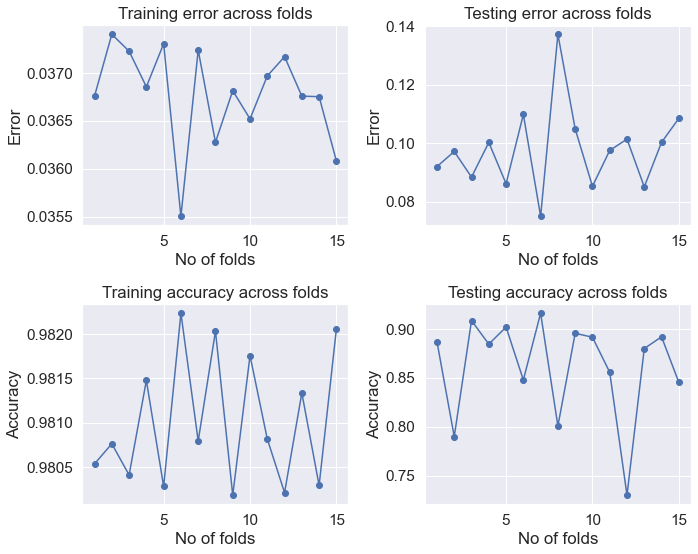

In [557]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Training error across folds')

plt.subplot(2,2,2)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Testing error across folds')

plt.subplot(2,2,3)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Training accuracy across folds')

plt.subplot(2,2,4)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Testing accuracy across folds')
plt.tight_layout()

# 20.1 Decision Tree Regressor

In [558]:
from sklearn.tree import DecisionTreeRegressor

In [559]:
dtr=DecisionTreeRegressor()

In [560]:
x_train,x_test,y_train,y_test=train_test_split(x_scaled,y,test_size=0.25,random_state=2347)

In [561]:
dtr.fit(x_train,y_train)

DecisionTreeRegressor()

## 20.2 Evaluation Matrix

In [562]:
pred_test=dtr.predict(x_test)

In [563]:
MAE=mean_absolute_error(y_test,pred_test)

In [564]:
MAE

0.1422683107203738

In [565]:
RMSE=np.sqrt(mean_squared_error(y_test,pred_test))

In [566]:
RMSE

0.19267667737092473

In [567]:
dtr_score=r2_score(y_test,pred_test)

In [568]:
dtr_score

0.7314839987149456

In [569]:
dtr_MAE=mean_absolute_error(y_test,pred_test)

In [570]:
dtr_MAE

0.1422683107203738

## 20.3 Choosing Best CV and score

In [571]:
for j in range(2,15):
    dtr_score=cross_val_score(dtr,x_scaled,y,cv=j)
    dtr_s=dtr_score.mean()
    print("AT CV :-",j)
    print("CV Score:",dtr_s*100)
    print("\n")

AT CV :- 2
CV Score: 67.79379843093567


AT CV :- 3
CV Score: 67.8571106607553


AT CV :- 4
CV Score: 68.66509616240869


AT CV :- 5
CV Score: 71.21410932199825


AT CV :- 6
CV Score: 67.43174674874653


AT CV :- 7
CV Score: 66.83995646731799


AT CV :- 8
CV Score: 67.7026884415182


AT CV :- 9
CV Score: 68.61095012918965


AT CV :- 10
CV Score: 69.17276999049514


AT CV :- 11
CV Score: 66.33295913654274


AT CV :- 12
CV Score: 65.6291418385338


AT CV :- 13
CV Score: 69.57214049257445


AT CV :- 14
CV Score: 70.91704612001945




**We can choose best cv 14.**

In [572]:
cross_val_score(dtr,x_scaled,y,cv=14)

array([0.63007413, 0.78187867, 0.7746421 , 0.82102909, 0.53324753,
       0.72407854, 0.74463611, 0.5746413 , 0.75960205, 0.72212419,
       0.81437717, 0.65585254, 0.76013728, 0.63851177])

In [573]:
dtr_cv_score=cross_val_score(dtr,x_scaled,y,cv=14).mean()

In [574]:
dtr_cv_score

0.7176309167724249

In [575]:
dtr_score=r2_score(y_test,pred_test)

In [576]:
dtr_score

0.7314839987149456

## 20.4 Checking for Overfitting or Underfitting for model

In [577]:
kf = KFold(n_splits=15,shuffle=True) 
training_error = []
training_R2_Score = []
testing_error = []
testing_R2_Score = []
for train_index,test_index in kf.split(x_scaled): 
    x_train,x_test = x_scaled[train_index],x_scaled[test_index]
    y_train,y_test = y[train_index],y[test_index]
    dtr = DecisionTreeRegressor()
    dtr.fit(x_train,y_train)
    train_data_pred = dtr.predict(x_train)
    test_data_pred = dtr.predict(x_test)
    training_error.append(mean_absolute_error(y_train,train_data_pred))
    testing_error.append(mean_absolute_error(y_test,test_data_pred))
    training_R2_Score.append(r2_score(y_train,train_data_pred))
    testing_R2_Score.append(r2_score(y_test,test_data_pred))

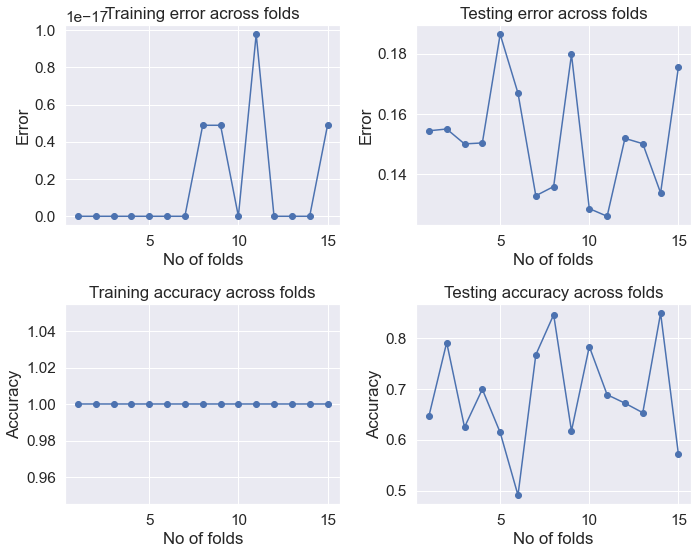

In [578]:
plt.figure(figsize=(10,8))
plt.subplot(2,2,1)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Training error across folds')

plt.subplot(2,2,2)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_error).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Error')
plt.title('Testing error across folds')

plt.subplot(2,2,3)
plt.plot(range(1,kf.get_n_splits()+1),np.array(training_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Training accuracy across folds')

plt.subplot(2,2,4)
plt.plot(range(1,kf.get_n_splits()+1),np.array(testing_R2_Score).ravel(),'o-')
plt.xlabel('No of folds')
plt.ylabel('Accuracy')
plt.title('Testing accuracy across folds')
plt.tight_layout()

# 21. Choosing best model based

In [581]:
mlr_score=round(mlr_score,2)
ridge_score=round(ridge_score,2)
lasso_score=round(lasso_score,2)
rfr_score=round(rfr_score,2)
dtr_score=round(dtr_score,2)

In [582]:
mlr_cv_score=round(mlr_cv_score,2)
ridge_model_cv_score=round(ridge_model_cv_score,2)
lasso_cv_score=round(lasso_cv_score,2)
rfr_cv_score=round(rfr_cv_score,2)
dtr_cv_score=round(dtr_cv_score,2)

In [583]:
Linear_Regression={"R2 Score":(mlr_score,2),
                    "CV Score":(mlr_cv_score,2),
                    "Difference":mlr_score-mlr_cv_score,
                    "MAE":mlr_MAE}
Ridge_Regression={"R2 Score":(ridge_score,2),
                    "CV Score":(ridge_model_cv_score,2),
                    "Difference":ridge_score-ridge_model_cv_score,
                 "MAE":ridge_MAE}
Lasso_Regression={"R2 Score":(lasso_score,2),
                    "CV Score":(lasso_cv_score,2),
                    "Difference":lasso_score-lasso_cv_score,
                 "MAE":lasso_MAE}
Random_Forest_Regression={"R2 Score":(rfr_score,2),
                    "CV Score":(rfr_cv_score,2),
                    "Difference":rfr_score-rfr_cv_score,
                 "MAE":rfr_MAE}
Decision_Tree_Regressor={"R2 Score":(dtr_score,2),
                    "CV Score":(dtr_cv_score,2),
                    "Difference":dtr_score-dtr_cv_score,
                 "MAE":dtr_MAE}


In [584]:
data=np.array([[mlr_score,mlr_cv_score,mlr_score-mlr_cv_score,mlr_MAE],[ridge_score,ridge_model_cv_score,ridge_score-ridge_model_cv_score,ridge_MAE],[lasso_score,lasso_cv_score,lasso_score-lasso_cv_score,lasso_MAE],[rfr_score,rfr_cv_score,rfr_score-rfr_cv_score,rfr_MAE],[dtr_score,dtr_cv_score,dtr_score-dtr_cv_score,dtr_MAE]])

In [585]:
index_value=["Linear_Regression","Ridge_Regression","Lasso_Regression","Random_Forest_Regression","Decision_Tree_Regressor"]

In [601]:
columns_value=["R2 Score","Cross Validation Score","Difference","MAE"]

In [603]:
model_selection=pd.DataFrame(data=data,
                            index=index_value,
                            columns=columns_value)

In [604]:
model_selection

,R2 Score,Cross Validation Score,Difference,MAE
Linear_Regression,0.91,-1.177315e+24,1.177315e+24,0.082622
Ridge_Regression,0.91,8.600000e-01,5.000000e-02,0.082463
Lasso_Regression,-0.01,-1.000000e-02,0.000000e+00,0.288509
Random_Forest_Regression,0.88,8.600000e-01,2.000000e-02,0.090164
Decision_Tree_Regressor,0.73,7.200000e-01,1.000000e-02,0.142268


# 21. Hypertuning of Ridge Regression

In [605]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from numpy import arange

In [606]:
ridge_model = Ridge()
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=2347)
grid = dict()
grid['alpha'] = arange(0, 1, 0.01)
search = GridSearchCV(ridge_model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
results = search.fit(x_scaled, y)
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

MAE: -0.094
Config: {'alpha': 0.99}


In [607]:
ridge_model=Ridge(alpha=0.99)

In [608]:
ridge_model.fit(x_train,y_train)

Ridge(alpha=0.99)

In [609]:
test_pred=ridge_model.predict(x_test)

In [610]:
r2_score(y_test,test_pred)

0.8051977191584011

# 23. Predict on test dataset

In [611]:
test_new.shape

(292, 156)

In [612]:
scaler=StandardScaler()

In [613]:
test_scaled=scaler.fit_transform(test_new)

In [614]:
pred_test_new=ridge_model.predict(test_scaled)

In [615]:
pred_test_new[1:10]

array([12.32017093, 12.53920989, 11.97030928, 12.30157762, 11.20681273,
       11.72521668, 12.86296174, 12.53833362, 12.03807565])

# 24. Saving the model

In [616]:
import pickle
filename="Housing_price_prediction.pkl"
pickle.dump(ridge_model,open(filename,"wb"))